# Data Preparation

In [1]:
import parselmouth
import os
import glob
import pandas as pd
import numpy as np
from math import *
import matplotlib.pyplot as plt
import sys
from collections import Counter

import shutil  # copy files
from os import path

from scipy.stats.stats import pearsonr
from scipy.stats.stats import spearmanr
# import statsmodels.graphics.api as smg

import nltk
from nltk import word_tokenize
from nltk.util import ngrams
from nltk.stem.lancaster import LancasterStemmer
from nltk.corpus import stopwords

import re

from time import time

import pickle

## Processing .wav files

In [652]:
# make sure .wav file and .text file (transcripts) have the same number

print(len(glob.glob('../switchboard_word_alignments/*/*/*/*.text'))/2) 
print(len(glob.glob('../swb1_LDC97S62/*/*/*.wav'))*2) 

4876.0
4876


In [59]:
# read .wav files and make mono .wav files 

def read_wav(wav_file):
    print("processing {}...".format(wav_file))
    snd = parselmouth.Sound(wav_file)
    
    # extract channels
    if len(snd.extract_all_channels()) == 2:
        snd_A = snd.extract_all_channels()[0]
        snd_B = snd.extract_all_channels()[1]
        
        # save wave files       
        snd_A.save(os.path.splitext(wav_file)[0] + "A.wav", 'WAV')
        snd_B.save(os.path.splitext(wav_file)[0] + "B.wav", 'WAV')

In [60]:
# extract 2-channel .wav files

for wav_file in glob.glob("../swb1_LDC97S62/swb1_d4/*/*.wav"):
    read_wav(wav_file)

processing ../swb1_LDC97S62/swb1_d4/data/sw04376.wav...
processing ../swb1_LDC97S62/swb1_d4/data/sw03814.wav...
processing ../swb1_LDC97S62/swb1_d4/data/sw03800.wav...
processing ../swb1_LDC97S62/swb1_d4/data/sw03828.wav...
processing ../swb1_LDC97S62/swb1_d4/data/sw04821.wav...
processing ../swb1_LDC97S62/swb1_d4/data/sw04835.wav...
processing ../swb1_LDC97S62/swb1_d4/data/sw03784.wav...
processing ../swb1_LDC97S62/swb1_d4/data/sw04799.wav...
processing ../swb1_LDC97S62/swb1_d4/data/sw03948.wav...
processing ../swb1_LDC97S62/swb1_d4/data/sw04014.wav...
processing ../swb1_LDC97S62/swb1_d4/data/sw04000.wav...
processing ../swb1_LDC97S62/swb1_d4/data/sw03747.wav...
processing ../swb1_LDC97S62/swb1_d4/data/sw04570.wav...
processing ../swb1_LDC97S62/swb1_d4/data/sw04559.wav...
processing ../swb1_LDC97S62/swb1_d4/data/sw04565.wav...
processing ../swb1_LDC97S62/swb1_d4/data/sw03752.wav...
processing ../swb1_LDC97S62/swb1_d4/data/sw03746.wav...
processing ../swb1_LDC97S62/swb1_d4/data/sw04940

processing ../swb1_LDC97S62/swb1_d4/data/sw04666.wav...
processing ../swb1_LDC97S62/swb1_d4/data/sw04128.wav...
processing ../swb1_LDC97S62/swb1_d4/data/sw03914.wav...
processing ../swb1_LDC97S62/swb1_d4/data/sw03900.wav...
processing ../swb1_LDC97S62/swb1_d4/data/sw03928.wav...
processing ../swb1_LDC97S62/swb1_d4/data/sw04074.wav...
processing ../swb1_LDC97S62/swb1_d4/data/sw04289.wav...
processing ../swb1_LDC97S62/swb1_d4/data/sw04262.wav...
processing ../swb1_LDC97S62/swb1_d4/data/sw04276.wav...
processing ../swb1_LDC97S62/swb1_d4/data/sw04277.wav...
processing ../swb1_LDC97S62/swb1_d4/data/sw04263.wav...
processing ../swb1_LDC97S62/swb1_d4/data/sw04075.wav...
processing ../swb1_LDC97S62/swb1_d4/data/sw03929.wav...
processing ../swb1_LDC97S62/swb1_d4/data/sw03901.wav...
processing ../swb1_LDC97S62/swb1_d4/data/sw03915.wav...
processing ../swb1_LDC97S62/swb1_d4/data/sw04101.wav...
processing ../swb1_LDC97S62/swb1_d4/data/sw04667.wav...
processing ../swb1_LDC97S62/swb1_d4/data/sw04698

processing ../swb1_LDC97S62/swb1_d4/data/sw04119.wav...
processing ../swb1_LDC97S62/swb1_d4/data/sw03851.wav...
processing ../swb1_LDC97S62/swb1_d4/data/sw03845.wav...
processing ../swb1_LDC97S62/swb1_d4/data/sw03879.wav...
processing ../swb1_LDC97S62/swb1_d4/data/sw04327.wav...
processing ../swb1_LDC97S62/swb1_d4/data/sw04333.wav...
processing ../swb1_LDC97S62/swb1_d4/data/sw04331.wav...
processing ../swb1_LDC97S62/swb1_d4/data/sw03853.wav...
processing ../swb1_LDC97S62/swb1_d4/data/sw04696.wav...
processing ../swb1_LDC97S62/swb1_d4/data/sw03847.wav...
processing ../swb1_LDC97S62/swb1_d4/data/sw03890.wav...
processing ../swb1_LDC97S62/swb1_d4/data/sw04127.wav...
processing ../swb1_LDC97S62/swb1_d4/data/sw04641.wav...
processing ../swb1_LDC97S62/swb1_d4/data/sw04899.wav...
processing ../swb1_LDC97S62/swb1_d4/data/sw03884.wav...
processing ../swb1_LDC97S62/swb1_d4/data/sw04133.wav...
processing ../swb1_LDC97S62/swb1_d4/data/sw03927.wav...
processing ../swb1_LDC97S62/swb1_d4/data/sw03933

processing ../swb1_LDC97S62/swb1_d4/data/sw03831.wav...
processing ../swb1_LDC97S62/swb1_d4/data/sw04804.wav...
processing ../swb1_LDC97S62/swb1_d4/data/sw04353.wav...
processing ../swb1_LDC97S62/swb1_d4/data/sw04347.wav...
processing ../swb1_LDC97S62/swb1_d4/data/sw04421.wav...
processing ../swb1_LDC97S62/swb1_d4/data/sw04384.wav...


In [61]:
# remove precessed 2-channel .wav files

for f in glob.glob("../swb1_LDC97S62/swb1_d4/data/sw0????.wav"):
    os.remove(f)

In [62]:
# copy transcripts to the working dir

wav_paths = glob.glob("../swb1_LDC97S62/swb1_d4/*/*.wav")
names = []
for p in wav_paths:
    names.append(p[-9:-4])
    set(names)
# print(names)
names = sorted(names)
print(len(names))
print(names)


894
['2289A', '2289B', '3730A', '3730B', '3738A', '3738B', '3743A', '3743B', '3746A', '3746B', '3747A', '3747B', '3751A', '3751B', '3752A', '3752B', '3758A', '3758B', '3759A', '3759B', '3763A', '3763B', '3764A', '3764B', '3765A', '3765B', '3770A', '3770B', '3776A', '3776B', '3777A', '3777B', '3778A', '3778B', '3779A', '3779B', '3781A', '3781B', '3782A', '3782B', '3783A', '3783B', '3784A', '3784B', '3789A', '3789B', '3794A', '3794B', '3795A', '3795B', '3796A', '3796B', '3797A', '3797B', '3798A', '3798B', '3800A', '3800B', '3801A', '3801B', '3802A', '3802B', '3807A', '3807B', '3808A', '3808B', '3809A', '3809B', '3812A', '3812B', '3813A', '3813B', '3814A', '3814B', '3815A', '3815B', '3820A', '3820B', '3821A', '3821B', '3826A', '3826B', '3827A', '3827B', '3828A', '3828B', '3829A', '3829B', '3831A', '3831B', '3832A', '3832B', '3833A', '3833B', '3834A', '3834B', '3839A', '3839B', '3844A', '3844B', '3845A', '3845B', '3846A', '3846B', '3847A', '3847B', '3848A', '3848B', '3850A', '3850B', '3851

In [64]:
# import shutil
# from os import path

trans_path_list =[]
for i in range(len(names)):
    trans_path = glob.glob("../switchboard_word_alignments/swb_ms98_transcriptions/*/*/sw"+names[i] + "-ms98-a-word.text")
    if len(trans_path) != 0:
        trans_path_list.append(trans_path[0])

print(len(trans_path_list))
print(trans_path_list)



894
['../switchboard_word_alignments/swb_ms98_transcriptions/22/2289/sw2289A-ms98-a-word.text', '../switchboard_word_alignments/swb_ms98_transcriptions/22/2289/sw2289B-ms98-a-word.text', '../switchboard_word_alignments/swb_ms98_transcriptions/37/3730/sw3730A-ms98-a-word.text', '../switchboard_word_alignments/swb_ms98_transcriptions/37/3730/sw3730B-ms98-a-word.text', '../switchboard_word_alignments/swb_ms98_transcriptions/37/3738/sw3738A-ms98-a-word.text', '../switchboard_word_alignments/swb_ms98_transcriptions/37/3738/sw3738B-ms98-a-word.text', '../switchboard_word_alignments/swb_ms98_transcriptions/37/3743/sw3743A-ms98-a-word.text', '../switchboard_word_alignments/swb_ms98_transcriptions/37/3743/sw3743B-ms98-a-word.text', '../switchboard_word_alignments/swb_ms98_transcriptions/37/3746/sw3746A-ms98-a-word.text', '../switchboard_word_alignments/swb_ms98_transcriptions/37/3746/sw3746B-ms98-a-word.text', '../switchboard_word_alignments/swb_ms98_transcriptions/37/3747/sw3747A-ms98-a-word.t

In [66]:
# copy transcript files to wave file dir 

for tp in trans_path_list:
    if path.exists(tp):
        # path of source file
        src = path.realpath(tp)
        # head = path, tail = file name
        head, tail= path.split(src)
        # path of destinition
        tail = tail[0:2] + '0' + tail[2:7] + '.text'
        dst = "../swb1_LDC97S62/swb1_d4/data/" + tail
        print(dst)
        shutil.copy(src, dst)

../swb1_LDC97S62/swb1_d4/data/sw02289A.text
../swb1_LDC97S62/swb1_d4/data/sw02289B.text
../swb1_LDC97S62/swb1_d4/data/sw03730A.text
../swb1_LDC97S62/swb1_d4/data/sw03730B.text
../swb1_LDC97S62/swb1_d4/data/sw03738A.text
../swb1_LDC97S62/swb1_d4/data/sw03738B.text
../swb1_LDC97S62/swb1_d4/data/sw03743A.text
../swb1_LDC97S62/swb1_d4/data/sw03743B.text
../swb1_LDC97S62/swb1_d4/data/sw03746A.text
../swb1_LDC97S62/swb1_d4/data/sw03746B.text
../swb1_LDC97S62/swb1_d4/data/sw03747A.text
../swb1_LDC97S62/swb1_d4/data/sw03747B.text
../swb1_LDC97S62/swb1_d4/data/sw03751A.text
../swb1_LDC97S62/swb1_d4/data/sw03751B.text
../swb1_LDC97S62/swb1_d4/data/sw03752A.text
../swb1_LDC97S62/swb1_d4/data/sw03752B.text
../swb1_LDC97S62/swb1_d4/data/sw03758A.text
../swb1_LDC97S62/swb1_d4/data/sw03758B.text
../swb1_LDC97S62/swb1_d4/data/sw03759A.text
../swb1_LDC97S62/swb1_d4/data/sw03759B.text
../swb1_LDC97S62/swb1_d4/data/sw03763A.text
../swb1_LDC97S62/swb1_d4/data/sw03763B.text
../swb1_LDC97S62/swb1_d4/data/sw

../swb1_LDC97S62/swb1_d4/data/sw04089B.text
../swb1_LDC97S62/swb1_d4/data/sw04093A.text
../swb1_LDC97S62/swb1_d4/data/sw04093B.text
../swb1_LDC97S62/swb1_d4/data/sw04094A.text
../swb1_LDC97S62/swb1_d4/data/sw04094B.text
../swb1_LDC97S62/swb1_d4/data/sw04095A.text
../swb1_LDC97S62/swb1_d4/data/sw04095B.text
../swb1_LDC97S62/swb1_d4/data/sw04096A.text
../swb1_LDC97S62/swb1_d4/data/sw04096B.text
../swb1_LDC97S62/swb1_d4/data/sw04100A.text
../swb1_LDC97S62/swb1_d4/data/sw04100B.text
../swb1_LDC97S62/swb1_d4/data/sw04101A.text
../swb1_LDC97S62/swb1_d4/data/sw04101B.text
../swb1_LDC97S62/swb1_d4/data/sw04106A.text
../swb1_LDC97S62/swb1_d4/data/sw04106B.text
../swb1_LDC97S62/swb1_d4/data/sw04107A.text
../swb1_LDC97S62/swb1_d4/data/sw04107B.text
../swb1_LDC97S62/swb1_d4/data/sw04108A.text
../swb1_LDC97S62/swb1_d4/data/sw04108B.text
../swb1_LDC97S62/swb1_d4/data/sw04109A.text
../swb1_LDC97S62/swb1_d4/data/sw04109B.text
../swb1_LDC97S62/swb1_d4/data/sw04111A.text
../swb1_LDC97S62/swb1_d4/data/sw

../swb1_LDC97S62/swb1_d4/data/sw04281A.text
../swb1_LDC97S62/swb1_d4/data/sw04281B.text
../swb1_LDC97S62/swb1_d4/data/sw04282A.text
../swb1_LDC97S62/swb1_d4/data/sw04282B.text
../swb1_LDC97S62/swb1_d4/data/sw04283A.text
../swb1_LDC97S62/swb1_d4/data/sw04283B.text
../swb1_LDC97S62/swb1_d4/data/sw04284A.text
../swb1_LDC97S62/swb1_d4/data/sw04284B.text
../swb1_LDC97S62/swb1_d4/data/sw04289A.text
../swb1_LDC97S62/swb1_d4/data/sw04289B.text
../swb1_LDC97S62/swb1_d4/data/sw04294A.text
../swb1_LDC97S62/swb1_d4/data/sw04294B.text
../swb1_LDC97S62/swb1_d4/data/sw04295A.text
../swb1_LDC97S62/swb1_d4/data/sw04295B.text
../swb1_LDC97S62/swb1_d4/data/sw04296A.text
../swb1_LDC97S62/swb1_d4/data/sw04296B.text
../swb1_LDC97S62/swb1_d4/data/sw04297A.text
../swb1_LDC97S62/swb1_d4/data/sw04297B.text
../swb1_LDC97S62/swb1_d4/data/sw04298A.text
../swb1_LDC97S62/swb1_d4/data/sw04298B.text
../swb1_LDC97S62/swb1_d4/data/sw04300A.text
../swb1_LDC97S62/swb1_d4/data/sw04300B.text
../swb1_LDC97S62/swb1_d4/data/sw

../swb1_LDC97S62/swb1_d4/data/sw04911A.text
../swb1_LDC97S62/swb1_d4/data/sw04911B.text
../swb1_LDC97S62/swb1_d4/data/sw04917A.text
../swb1_LDC97S62/swb1_d4/data/sw04917B.text
../swb1_LDC97S62/swb1_d4/data/sw04936A.text
../swb1_LDC97S62/swb1_d4/data/sw04936B.text
../swb1_LDC97S62/swb1_d4/data/sw04940A.text
../swb1_LDC97S62/swb1_d4/data/sw04940B.text


## Generating Praat .TextGrid files

In [67]:
# read transcription files and add headers

def read_trans(trans_path):
    trans = pd.read_csv(trans_path, sep= "\s+", header=None)
    
    trans.columns = ["ms_id", "start_time", "end_time", "ms_trans"]
    
    # drop rows which have the same start time
    trans = trans.drop_duplicates(subset="end_time")
    
    # however index cannot be reset, so convert df to nparray
    trans = trans.to_numpy()
    
    # endtime cannot be 0 in case of error in creating .textgrid
    trans = np.delete(trans, np.where(trans[:, 2]==0)[0], axis=0)
    
    return trans

In [68]:
# get path list and trans list

trans_paths = sorted(glob.glob("../swb1_LDC97S62/swb1_d4/data/*.text"))
# print(trans_paths)
sound_paths = sorted(glob.glob("../swb1_LDC97S62/swb1_d4/data/*.wav"))
# print(sound_paths)

for i in range(len(sound_paths)):
    print(trans_paths[i], sound_paths[i])

../swb1_LDC97S62/swb1_d4/data/sw02289A.text ../swb1_LDC97S62/swb1_d4/data/sw02289A.wav
../swb1_LDC97S62/swb1_d4/data/sw02289B.text ../swb1_LDC97S62/swb1_d4/data/sw02289B.wav
../swb1_LDC97S62/swb1_d4/data/sw03730A.text ../swb1_LDC97S62/swb1_d4/data/sw03730A.wav
../swb1_LDC97S62/swb1_d4/data/sw03730B.text ../swb1_LDC97S62/swb1_d4/data/sw03730B.wav
../swb1_LDC97S62/swb1_d4/data/sw03738A.text ../swb1_LDC97S62/swb1_d4/data/sw03738A.wav
../swb1_LDC97S62/swb1_d4/data/sw03738B.text ../swb1_LDC97S62/swb1_d4/data/sw03738B.wav
../swb1_LDC97S62/swb1_d4/data/sw03743A.text ../swb1_LDC97S62/swb1_d4/data/sw03743A.wav
../swb1_LDC97S62/swb1_d4/data/sw03743B.text ../swb1_LDC97S62/swb1_d4/data/sw03743B.wav
../swb1_LDC97S62/swb1_d4/data/sw03746A.text ../swb1_LDC97S62/swb1_d4/data/sw03746A.wav
../swb1_LDC97S62/swb1_d4/data/sw03746B.text ../swb1_LDC97S62/swb1_d4/data/sw03746B.wav
../swb1_LDC97S62/swb1_d4/data/sw03747A.text ../swb1_LDC97S62/swb1_d4/data/sw03747A.wav
../swb1_LDC97S62/swb1_d4/data/sw03747B.text

In [69]:
# function to create a TextGrid 

def text_grid(sound, trans):
    snd = parselmouth.Sound(sound)
    tg = parselmouth.praat.call(snd, "To TextGrid", "word", "")
    
    trans = read_trans(trans)
    
    # timeit df.index < df.shape < df.[0].count()
    for i in range(len(trans)):
        if i < len(trans)-1:
            # one time point can only insert one boundary, need to delete rows with same time points
            # parselmouth.praat.call(tg, "Insert boundary", 1, trans.start_time[i+1])
            parselmouth.praat.call(tg, "Insert boundary", 1, trans[i, 2])
            parselmouth.praat.call(tg, "Set interval text", 1, i+1, trans[i, 3])
        else:
            parselmouth.praat.call(tg, "Set interval text", 1, i+1, trans[i, 3])
        
    tg.save(os.path.splitext(sound)[0] + ".TextGrid")

In [70]:
# create .TextGrid files

for i in range(len(sound_paths)):
    text_grid(sound_paths[i], trans_paths[i]) 

# Feature Extraction

## ProsodyPro

## Feature list

1. continuous f0 velocity: (= first derivative of f0) curves (for labeled intervals only)

2. sampled f0: f0 at fixed time intervals as determined by F0_sample_rate (number of points per second)

3. maxf0 (Hz)

4. maxf0_loc_ms -- Time of the f0 peak relative to the onset of an interval in milliseconds

5. maxf0_loc_ratio -- Relative location of the f0 peak as a proportion to the duration of the interval

6. minf0 (Hz)

7. meanf0 (Hz) average F0 in Hz

8. finalf0 (Hz) -- Indicator of target height (taken at a point specified by "Final offset" in the startup window); F0 near the interval offset in Hz
                   
9. max_velocity (semitones/s)

10. final_velocity (semitones/s) -- Indicator of target slope (taken also at a point earlier than the interval offset by time specified by "Final offset" in the startup window)

11. mean intensity (dB)

12. duration (ms) -- interval duration in ms

In [37]:
# run ProsodyPro Praat script to do feature extraction
# pay attention to the fn parameters

parselmouth.praat.run_file()

PraatError: Cannot open file “/Users/the-imitation-gamer/Documents/SLP/Msc_Dissertation/Prosody-and-Perplexity/../data/demo/data/sw2005A-word.TextGrid”.
Script line 317 not performed or completed:
« Read from file... 'gv_word_textgrid$' »
Script not completed.

## Extacting prosodic feature data

In [ ]:
### run once

# copy prosodic feature files to wave file dir 

for pfp in glob.glob("../prosody_pro/test all/*.means"):
    if path.exists(pfp):
        # path of source file
        src = path.realpath(pfp)
        # head = path, tail = file name
        head, tail= path.split(src)
        # path of destinition
        dst = "../data/" + tail
        print(dst)
        shutil.copy(src, dst)

In [41]:
# pf tables of multi-files

pfs = []
for pfp in sorted(glob.glob("../data/*.means")):
    pf_df = pd.read_csv(pfp, sep= "\s+")
    pf_arr = pf_df.to_numpy()
    pf_arr = np.where(pf_arr == "--undefined--", 0.0, pf_arr)
    
    # colunms = ["rowlabel", "maxf0", "minf0", "excursion_size", "meanf0", "finalf0", "mean_intensity", "duration", "max_velocity", "final_velocity", "maxf0_loc_ms", "maxf0_loc_ratio"]
    pfs.append(pf_arr)
#print(len(pfs))
#print(pfs)

In [42]:
len_list1 = []
for pf in pfs:
    print(pf.shape)
    len_list1.append(pf.shape[0])
print(len_list1)

(1381, 12)
(964, 12)
(711, 12)
(627, 12)
(820, 12)
(603, 12)
(1753, 12)
(689, 12)
(285, 12)
(195, 12)
(866, 12)
(522, 12)
(633, 12)
(1643, 12)
(1287, 12)
(1030, 12)
(1168, 12)
(454, 12)
(908, 12)
(393, 12)
(963, 12)
(676, 12)
(768, 12)
(681, 12)
(839, 12)
(532, 12)
(565, 12)
(771, 12)
(392, 12)
(796, 12)
(477, 12)
(820, 12)
(596, 12)
(806, 12)
(657, 12)
(728, 12)
(812, 12)
(477, 12)
(759, 12)
(571, 12)
(666, 12)
(714, 12)
(736, 12)
(568, 12)
[1381, 964, 711, 627, 820, 603, 1753, 689, 285, 195, 866, 522, 633, 1643, 1287, 1030, 1168, 454, 908, 393, 963, 676, 768, 681, 839, 532, 565, 771, 392, 796, 477, 820, 596, 806, 657, 728, 812, 477, 759, 571, 666, 714, 736, 568]


In [43]:
# word importance tables

wimps = []
len_list2 = []
for wimpp in sorted(glob.glob("../wimp_corpus/annotations/*/*/*word.text")):
    wimp_df = pd.read_csv(wimpp, sep= "\s+", header = None)
    wimp_df.columns = ["ms_id", "start_time", "end_time", "wimp"]
    wimp_df = wimp_df.drop_duplicates(subset="end_time")
    wimp_arr = wimp_df.to_numpy()
    
    # end time in 1st row cannot be 0
    wimp_arr = np.delete(wimp_arr, np.where(wimp_arr[:, 2]==0)[0], axis=0)
    
    wimp = wimp_arr[:, 3]
    
    # check why wimps size != pfs size
    print(len(wimp))
    len_list2.append(len(wimp))

    # colunms = ["rowlabel", "maxf0", "minf0", "excursion_size", "meanf0", "finalf0", "mean_intensity", "duration", "max_velocity", "final_velocity", "maxf0_loc_ms", "maxf0_loc_ratio"]
    wimps.append(wimp)

print(len_list2)
    
    
#print(len(wimps))
#print(wimps)

1381
964
711
627
820
603
1753
689
285
195
866
522
633
1643
1287
1030
1168
454
908
393
963
676
768
681
839
532
565
771
392
796
477
820
596
806
657
728
812
477
759
571
666
714
736
568
[1381, 964, 711, 627, 820, 603, 1753, 689, 285, 195, 866, 522, 633, 1643, 1287, 1030, 1168, 454, 908, 393, 963, 676, 768, 681, 839, 532, 565, 771, 392, 796, 477, 820, 596, 806, 657, 728, 812, 477, 759, 571, 666, 714, 736, 568]


In [44]:
# check if pfs and wimps have the same size
# by checking if an element is/is not in a list

for ele in len_list1:
    print(ele in len_list2)
    if ele not in len_list2:
        print(len_list1.index(ele))
        print(sorted(glob.glob("../wimp_corpus/annotations/*/*/*word.text"))[len_list1.index(ele)])
        print(len(wimps[len_list1.index(ele)]))
        print(pfs[len_list1.index(ele)].shape[0])
        

True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True


In [45]:
del ele, len_list1, len_list2

In [24]:
# demo pfs

pf_df_test = pd.read_csv("/Users/the-imitation-gamer/Documents/SLP/Msc_Dissertation/data/sw2005B.means", sep= "\s+")
# print(pf_df_test)
#pf_df_test.to_numpy()
type(pf_df_test["maxf0"])

pandas.core.series.Series

# Word Importance Data

## Range and description

- [0 - 0.3): Words that are of least importance - these words can be easily omitted from the text without much consequence.
- [0.3 - 0.6): Words that are fairly important - omitting these words will take away some important details from the utterance.
- [0.6 - 1]: Words that are of high importance - omitting these words will change the message of the utterance quite significantly




# Data Pre-processing

## Concatenating pf dataframes

In [266]:
# concatenate pf dataframes

pfs_df_list = []
for pfp in sorted(glob.glob("../data/*.means")):
    pf_df = pd.read_csv(pfp, sep= "\s+")
#     pf_arr = np.where(pf_arr == "--undefined--", 0.0, pf_arr)
    
    pfs_df_list.append(pf_df)
pfs_dfs = pd.concat(pfs_df_list, ignore_index=True)
pfs_dfs

,rowLabel,maxf0,minf0,excursion_size,meanf0,finalf0,mean_intensity,duration,max_velocity,final_velocity,maxf0_loc_ms,maxf0_loc_ratio
0,[silence],118.916,118.916,0,--undefined--,118.915513,37.309,800.000,10.759513,0.000000,10,0.0125
1,okay,122.699,90.7804,5.2161,103.08329929149497,91.706489,60.1498,480.000,-41.226733,6.073829,46.973,0.0978604
2,uh,100.41,90.3563,1.82654,91.82815735355445,91.554214,57.829,220.000,50.256391,37.407694,220,1
3,first,172.511,100.41,9.36938,163.57502187663115,145.482690,65.6864,485.000,50.446048,-14.411732,264.642,0.545653
4,um,141.971,110.559,4.32944,120.552135490563,115.269896,64.5333,497.250,-26.032538,4.460641,0,0
5,[silence],123.166,116.151,1.01523,--undefined--,122.284921,34.054,238.750,4.325783,4.177889,238.75,1
6,i,132.801,123.166,1.30393,127.1211561819994,127.119726,59.9677,116.750,34.580378,18.205977,116.75,1
7,need,151.599,132.801,2.29189,145.44030691021416,149.043897,59.2588,162.250,34.523954,-10.283348,101.467,0.625376
8,to,146.023,139.981,0.731573,--undefined--,143.001921,41.1048,60.000,-12.544629,-12.277729,0,0
9,know,139.981,112.535,3.77831,119.80223324524638,113.417757,59.4857,400.000,-13.051867,-5.032091,0,0


In [86]:
# create the pandas dataframe of the prosodic features with some words dropped

def concat_features(pf_paths, contat=False):
    pfs_df = []
    for p in pf_path:
        pf_df = pd.read_csv(p, sep="\s+", index_col=0, engine='python')
    
        special_characters = pf_df.index.str.extractall(r'(?P<square>.*\[.*)')
    
        pf_df.drop(special_characters.square, inplace=True)
    
        pf_df.replace('--undefined--', np.nan, inplace=True)
    
        pf_df = pf_df.astype("float64")
        pfs_df.append(pf_df)
    
    if contat == True:
        p_features = pd.concat(pfs_df)
    else:
        p_features = pfs_df
    return p_features

## Adding word importance

In [269]:
# Read word importance file

wimps = []
for wimpp in sorted(glob.glob("../wimp_corpus/annotations/*/*/*word.text")):
    wimp_df = pd.read_csv(wimpp, sep= "\s+", header = None)
    wimp_df.columns = ["ms_id", "start_time", "end_time", "wimp"]
    wimp_df = wimp_df.drop_duplicates(subset="end_time")
    wimp_arr = wimp_df.to_numpy()
    
    # end time in 1st row cannot be 0
    wimp_arr = np.delete(wimp_arr, np.where(wimp_arr[:, 2]==0)[0], axis=0)
    
    wimp = wimp_arr[:, 3]
    
    # colunms = ["rowlabel", "maxf0", "minf0", "excursion_size", "meanf0", "finalf0", "mean_intensity", "duration", "max_velocity", "final_velocity", "maxf0_loc_ms", "maxf0_loc_ratio"]
    wimps.append(wimp)


In [270]:
# flatten word importance data

flat_wimps = []
for wimp in wimps:
    for wi in wimp:
        flat_wimps.append(wi)
print(len(flat_wimps))
flat_wimps = np.asarray(flat_wimps, dtype=float)

33302


In [271]:
# create the feature-importance dataframe and save it to a .csv

wimps_df = pd.DataFrame(flat_wimps, columns=['wimp'])
pfs_wimps_df = pd.concat([pfs_dfs, wimps_df], axis=1)
pfs_wimps_df

,rowLabel,maxf0,minf0,excursion_size,meanf0,finalf0,mean_intensity,duration,max_velocity,final_velocity,maxf0_loc_ms,maxf0_loc_ratio,wimp
0,[silence],118.916,118.916,0,--undefined--,118.915513,37.309,800.000,10.759513,0.000000,10,0.0125,0.0
1,okay,122.699,90.7804,5.2161,103.08329929149497,91.706489,60.1498,480.000,-41.226733,6.073829,46.973,0.0978604,0.0
2,uh,100.41,90.3563,1.82654,91.82815735355445,91.554214,57.829,220.000,50.256391,37.407694,220,1,0.0
3,first,172.511,100.41,9.36938,163.57502187663115,145.482690,65.6864,485.000,50.446048,-14.411732,264.642,0.545653,0.2
4,um,141.971,110.559,4.32944,120.552135490563,115.269896,64.5333,497.250,-26.032538,4.460641,0,0,0.0
5,[silence],123.166,116.151,1.01523,--undefined--,122.284921,34.054,238.750,4.325783,4.177889,238.75,1,0.0
6,i,132.801,123.166,1.30393,127.1211561819994,127.119726,59.9677,116.750,34.580378,18.205977,116.75,1,0.1
7,need,151.599,132.801,2.29189,145.44030691021416,149.043897,59.2588,162.250,34.523954,-10.283348,101.467,0.625376,0.4
8,to,146.023,139.981,0.731573,--undefined--,143.001921,41.1048,60.000,-12.544629,-12.277729,0,0,0.0
9,know,139.981,112.535,3.77831,119.80223324524638,113.417757,59.4857,400.000,-13.051867,-5.032091,0,0,0.5


In [103]:
pfs_wimps_df.to_csv('../data/pfs_wimps.csv')

## Data summary

In [491]:
pfs_wimps_df = pd.read_csv('../data/csv/pfs_wimps.csv')
pfs_wimps_df.head(5)

,rowLabel,maxf0,minf0,excursion_size,meanf0,finalf0,mean_intensity,duration,max_velocity,final_velocity,maxf0_loc_ms,maxf0_loc_ratio,wimp
0,[silence],118.91551324540615,118.91551324540615,0.0,--undefined--,118.915513,37.308960756805405,800.00,10.759513,0.000000,10.0,0.0125,0.0
1,okay,122.69938916414736,90.78042581174572,5.216098876431057,103.08329929149497,91.706489,60.14984354307085,480.00,-41.226733,6.073829,46.97298884108458,0.09786039341892623,0.0
2,uh,100.41042779617308,90.35630494559496,1.8265430920474588,91.82815735355445,91.554214,57.829028959729435,220.00,50.256391,37.407694,220.0,1.0,0.0
3,first,172.51128788531247,100.41042779617308,9.36937993227308,163.57502187663115,145.482690,65.68639288339331,485.00,50.446048,-14.411732,264.64186615502115,0.545653332278394,0.2
4,um,141.97119647105336,110.55864095501371,4.329437696083641,120.552135490563,115.269896,64.53332588882817,497.25,-26.032538,4.460641,0.0,0.0,0.0


Generate descriptive statistics that summarize the **central tendency**, **dispersion** and shape of a dataset's **distribution**, excluding ``NaN`` values.

Analyzes both numeric and object series, as well as ``DataFrame`` column sets of mixed data types. The output will vary depending on what is provided. 

In [272]:
# get a data summary

pfs_wimps_df.describe()

,finalf0,duration,max_velocity,final_velocity,wimp
count,33302.000000,33302.000000,33302.000000,33302.000000,33302.000000
mean,163.394136,469.470400,-3.380221,0.205214,0.214136
std,73.731716,1386.280126,58.982467,27.827482,0.259934
min,67.282928,0.500000,-585.981025,-524.307227,0.000000
25%,111.624483,150.000000,-18.203731,-4.422771,0.000000
50%,142.411145,252.875000,0.000000,0.554255,0.100000
75%,194.979765,425.625000,10.136513,5.221445,0.300000
max,644.417947,52014.625000,506.098939,497.099197,1.000000


* Only numeric data, some cols missing? why?

In [273]:
pfs_wimps_df.dtypes

rowLabel            object
maxf0               object
minf0               object
excursion_size      object
meanf0              object
finalf0            float64
mean_intensity      object
duration           float64
max_velocity       float64
final_velocity     float64
maxf0_loc_ms        object
maxf0_loc_ratio     object
wimp               float64
dtype: object

In [276]:
pfs_wimps_df.describe(include='all')

,rowLabel,maxf0,minf0,excursion_size,meanf0,finalf0,mean_intensity,duration,max_velocity,final_velocity,maxf0_loc_ms,maxf0_loc_ratio,wimp
count,33302,33302.000000,33302.000000,33302.0,33302,33302.000000,33302,33302.000000,33302.000000,33302.000000,33302.0,33302.0,33302.000000
unique,2736,33149.000000,33155.000000,33096.0,21772,NaN,33268,NaN,NaN,NaN,18521.0,12472.0,NaN
top,[silence],220.084408,220.084408,0.0,--undefined--,NaN,--undefined--,NaN,NaN,NaN,0.0,1.0,NaN
freq,7913,14.000000,14.000000,205.0,11531,NaN,33,NaN,NaN,NaN,8541.0,11618.0,NaN
mean,NaN,NaN,NaN,NaN,NaN,163.394136,NaN,469.470400,-3.380221,0.205214,NaN,NaN,0.214136
std,NaN,NaN,NaN,NaN,NaN,73.731716,NaN,1386.280126,58.982467,27.827482,NaN,NaN,0.259934
min,NaN,NaN,NaN,NaN,NaN,67.282928,NaN,0.500000,-585.981025,-524.307227,NaN,NaN,0.000000
25%,NaN,NaN,NaN,NaN,NaN,111.624483,NaN,150.000000,-18.203731,-4.422771,NaN,NaN,0.000000
50%,NaN,NaN,NaN,NaN,NaN,142.411145,NaN,252.875000,0.000000,0.554255,NaN,NaN,0.100000
75%,NaN,NaN,NaN,NaN,NaN,194.979765,NaN,425.625000,10.136513,5.221445,NaN,NaN,0.300000


Finding:
- most frequent word: [silence], not relavant to the research;
- NaN value in col maxf0, minf0 ..., maybe there exists string values like "--undefined--" or ones that are not float64;
- Checking the .csv file, not only [silence], but [laughter], [noise], etc;

In [492]:
# round the decimal place to have a light-weight look

data_summary = pfs_wimps_df.describe(include='all').round(3)

In [495]:
pfs_wimps_df.describe(include=np.object)

,rowLabel,maxf0,minf0,excursion_size,meanf0,mean_intensity,maxf0_loc_ms,maxf0_loc_ratio
count,33302,33302,33302,33302,33302,33302,33302,33302
unique,2736,33149,33155,33096,21772,33268,18438,12472
top,[silence],220.0844083447713,220.0844083447713,0.0,--undefined--,--undefined--,0.0,1.0
freq,7913,14,14,205,11531,33,8541,11618


In [496]:
wimp_object_summary = pfs_wimps_df.describe(include=np.object)

In [497]:
wimp_object_summary.to_csv('../data/csv/wimp_object_summary.csv')

In [500]:
pfs_wimps_df.describe(include=np.number)

,finalf0,duration,max_velocity,final_velocity,wimp
count,33302.000000,33302.000000,33302.000000,33302.000000,33302.000000
mean,163.394136,469.470400,-3.380221,0.205214,0.214136
std,73.731716,1386.280126,58.982467,27.827482,0.259934
min,67.282928,0.500000,-585.981025,-524.307227,0.000000
25%,111.624483,150.000000,-18.203731,-4.422771,0.000000
50%,142.411145,252.875000,0.000000,0.554255,0.100000
75%,194.979765,425.625000,10.136513,5.221445,0.300000
max,644.417947,52014.625000,506.098939,497.099197,1.000000


## Data cleaning

### Remove special characters

There are some words with square brackets like "-[becau]se", "[laughter-and]".

Number in word importance data: 8,688/33,302 26.1%  

Number in corpus: 42,966/3,083,622 1.39%

This large amount may influnce the correlation coefficient.  

May cause missing values that hazard the computation of propability.

e.g.:  
[silence]
-[becau]se
-[re]fr[igerator]-
[abrode/abroad]
[Cam[pany]-/Company]
[laughter-again]
{babysittingwise}  



In [14]:
# extract table index that macth the regex pattern

pfs_wimps_df.index.str.extractall(r'(?P<square>.*\[.*)')

,,square
,match,
0,0,[silence]
5,0,[silence]
11,0,[silence]
12,0,h[ow]-
18,0,[silence]
20,0,[silence]
23,0,[silence]
27,0,[silence]
29,0,[silence]


In [432]:
# braces indicates non-canonical words which should not be removed.

pfs_wimps_df.index.str.extractall(r'(?P<square>.*[\[\{].*)')

,,square
,match,
0,0,[silence]
5,0,[silence]
11,0,[silence]
12,0,h[ow]-
18,0,[silence]
20,0,[silence]
23,0,[silence]
27,0,[silence]
29,0,[silence]


In [15]:
pfs_wimps_df.index.str.extractall(r'(?P<square>.*[\[\{].*)').to_csv('../data/csv/wimp_special_word_all.csv', index=False)

After checking the audio, it could be found that those parts of words in square brackets are ommited in the actual spoken utterances due to repeatition, self-correction or unstress. Hence, they could be dropped from the dataset.

In [17]:
special_characters = pfs_wimps_df.index.str.extractall(r'(?P<square>.*\[.*)').square.unique()

[vocalized-noise]

In [19]:
len(pfs_wimps_df.index.str.extractall(r'(?P<square>.*\[.*)').square.unique())

241

In [143]:
type(pfs_wimps_df.index)

pandas.core.indexes.base.Index

In [20]:
pfs_wimps_df.drop(special_characters, inplace=True)

In [22]:
# need to round again after drop

pfs_wimps_df = pfs_wimps_df.round(3)

In [23]:
pfs_wimps_df.to_csv('../data/csv/wimp_no_special_words.csv')

Clean the corpus

In [3]:
with open ('../data/corpus_word.txt', 'r') as f:
    corpus = f.readlines()

In [4]:
corpus_pd = pd.Series(corpus)

In [48]:
corpus_pd.to_csv('../data/csv/corpus_pd.csv')

/Users/the-imitation-gamer/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:1: FutureWarning: The signature of `Series.to_csv` was aligned to that of `DataFrame.to_csv`, and argument 'header' will change its default value from False to True: please pass an explicit value to suppress this warning.
  """Entry point for launching an IPython kernel.


In [25]:
corpus_pd.str.extractall(r'(?P<square>.*\[.*)')

,,square
,match,
0,0,[silence]
2,0,[silence]
4,0,[silence]
11,0,[silence]
15,0,[silence]
21,0,[silence]
36,0,[silence]
37,0,[silence]
38,0,[silence]


In [5]:
special_characters = corpus_pd.str.extractall(r'(?P<square>.*\[.*)')

In [27]:
special_characters.index.levels[0]

Int64Index([      0,       2,       4,      11,      15,      21,      36,
                 37,      38,      40,
            ...
            4046291, 4046292, 4046300, 4046302, 4046303, 4046304, 4046308,
            4046319, 4046328, 4046329],
           dtype='int64', length=997812)

In [28]:
corpus_pd.drop(special_characters.index.levels[0], inplace=True)

In [29]:
corpus = list(corpus_pd)

In [30]:
outF = open('../data/corpus_no_special_chars.txt', 'w')
for line in corpus:
    outF.write(line)
    outF.write("\n")
outF.close()

In [39]:
with open('../data/corpus_word.txt', 'r') as f:
    corpus = f.readlines()
#     word = re.findall(r'([A-Za-z\'\-\_\[\]/{}]+)\s', corpus)

In [43]:
len(corpus)

4046330

In [41]:
vocab = nltk.FreqDist(corpus)

In [42]:
# vocab with special chars

len(vocab)

38649

In [2]:
with open('../data/corpus_no_special_chars.txt', 'r') as f:
    corpus = f.readlines()
#     word = re.findall(r'([A-Za-z\'\-\_\[\]/{}]+)\s', corpus)

In [45]:
len(corpus)

3048518

In [33]:
# vocab without special chars

len(vocab)

29955

### Remove stop words

In [204]:
# remove stop words
nltk.download('stopwords')
from nltk.corpus import stopwords

[nltk_data] Downloading package stopwords to /Users/the-imitation-
[nltk_data]     gamer/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


In [205]:
sw = stopwords.words('english')
print(sw)

['i', 'me', 'my', 'myself', 'we', 'our', 'ours', 'ourselves', 'you', "you're", "you've", "you'll", "you'd", 'your', 'yours', 'yourself', 'yourselves', 'he', 'him', 'his', 'himself', 'she', "she's", 'her', 'hers', 'herself', 'it', "it's", 'its', 'itself', 'they', 'them', 'their', 'theirs', 'themselves', 'what', 'which', 'who', 'whom', 'this', 'that', "that'll", 'these', 'those', 'am', 'is', 'are', 'was', 'were', 'be', 'been', 'being', 'have', 'has', 'had', 'having', 'do', 'does', 'did', 'doing', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'because', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'during', 'before', 'after', 'above', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'once', 'here', 'there', 'when', 'where', 'why', 'how', 'all', 'any', 'both', 'each', 'few', 'more', 'most', 'other', 'some', 'such', 'no', 'nor', 'not', 'only', 'own', 'same', 'so', 'than', '

In [207]:
stpw = [word for word in list(pfs_wimps_df.index.unique()) if word in sw]
print(stpw)

[]


In [192]:
# a more comprehensive stop word list

sw_all = ["a","about","above","after","again","against","ain","all","am","an","and","any","are","aren","aren't","as","at","be","because","been","before","being","below","between","both","but","by","can","couldn","couldn't","d","did","didn","didn't","do","does","doesn","doesn't","doing","don","don't","down","during","each","few","for","from","further","had","hadn","hadn't","has","hasn","hasn't","have","haven","haven't","having","he","her","here","hers","herself","him","himself","his","how","i","if","in","into","is","isn","isn't","it","it's","its","itself","just","ll","m","ma","me","mightn","mightn't","more","most","mustn","mustn't","my","myself","needn","needn't","no","nor","not","now","o","of","off","on","once","only","or","other","our","ours","ourselves","out","over","own","re","s","same","shan","shan't","she","she's","should","should've","shouldn","shouldn't","so","some","such","t","than","that","that'll","the","their","theirs","them","themselves","then","there","these","they","this","those","through","to","too","under","until","up","ve","very","was","wasn","wasn't","we","were","weren","weren't","what","when","where","which","while","who","whom","why","will","with","won","won't","wouldn","wouldn't","y","you","you'd","you'll","you're","you've","your","yours","yourself","yourselves","could","he'd","he'll","he's","here's","how's","i'd","i'll","i'm","i've","let's","ought","she'd","she'll","that's","there's","they'd","they'll","they're","they've","we'd","we'll","we're","we've","what's","when's","where's","who's","why's","would","able","abst","accordance","according","accordingly","across","act","actually","added","adj","affected","affecting","affects","afterwards","ah","almost","alone","along","already","also","although","always","among","amongst","announce","another","anybody","anyhow","anymore","anyone","anything","anyway","anyways","anywhere","apparently","approximately","arent","arise","around","aside","ask","asking","auth","available","away","awfully","b","back","became","become","becomes","becoming","beforehand","begin","beginning","beginnings","begins","behind","believe","beside","besides","beyond","biol","brief","briefly","c","ca","came","cannot","can't","cause","causes","certain","certainly","co","com","come","comes","contain","containing","contains","couldnt","date","different","done","downwards","due","e","ed","edu","effect","eg","eight","eighty","either","else","elsewhere","end","ending","enough","especially","et","etc","even","ever","every","everybody","everyone","everything","everywhere","ex","except","f","far","ff","fifth","first","five","fix","followed","following","follows","former","formerly","forth","found","four","furthermore","g","gave","get","gets","getting","give","given","gives","giving","go","goes","gone","got","gotten","h","happens","hardly","hed","hence","hereafter","hereby","herein","heres","hereupon","hes","hi","hid","hither","home","howbeit","however","hundred","id","ie","im","immediate","immediately","importance","important","inc","indeed","index","information","instead","invention","inward","itd","it'll","j","k","keep","keeps","kept","kg","km","know","known","knows","l","largely","last","lately","later","latter","latterly","least","less","lest","let","lets","like","liked","likely","line","little","'ll","look","looking","looks","ltd","made","mainly","make","makes","many","may","maybe","mean","means","meantime","meanwhile","merely","mg","might","million","miss","ml","moreover","mostly","mr","mrs","much","mug","must","n","na","name","namely","nay","nd","near","nearly","necessarily","necessary","need","needs","neither","never","nevertheless","new","next","nine","ninety","nobody","non","none","nonetheless","noone","normally","nos","noted","nothing","nowhere","obtain","obtained","obviously","often","oh","ok","okay","old","omitted","one","ones","onto","ord","others","otherwise","outside","overall","owing","p","page","pages","part","particular","particularly","past","per","perhaps","placed","please","plus","poorly","possible","possibly","potentially","pp","predominantly","present","previously","primarily","probably","promptly","proud","provides","put","q","que","quickly","quite","qv","r","ran","rather","rd","readily","really","recent","recently","ref","refs","regarding","regardless","regards","related","relatively","research","respectively","resulted","resulting","results","right","run","said","saw","say","saying","says","sec","section","see","seeing","seem","seemed","seeming","seems","seen","self","selves","sent","seven","several","shall","shed","shes","show","showed","shown","showns","shows","significant","significantly","similar","similarly","since","six","slightly","somebody","somehow","someone","somethan","something","sometime","sometimes","somewhat","somewhere","soon","sorry","specifically","specified","specify","specifying","still","stop","strongly","sub","substantially","successfully","sufficiently","suggest","sup","sure","take","taken","taking","tell","tends","th","thank","thanks","thanx","thats","that've","thence","thereafter","thereby","thered","therefore","therein","there'll","thereof","therere","theres","thereto","thereupon","there've","theyd","theyre","think","thou","though","thoughh","thousand","throug","throughout","thru","thus","til","tip","together","took","toward","towards","tried","tries","truly","try","trying","ts","twice","two","u","un","unfortunately","unless","unlike","unlikely","unto","upon","ups","us","use","used","useful","usefully","usefulness","uses","using","usually","v","value","various","'ve","via","viz","vol","vols","vs","w","want","wants","wasnt","way","wed","welcome","went","werent","whatever","what'll","whats","whence","whenever","whereafter","whereas","whereby","wherein","wheres","whereupon","wherever","whether","whim","whither","whod","whoever","whole","who'll","whomever","whos","whose","widely","willing","wish","within","without","wont","words","world","wouldnt","www","x","yes","yet","youd","youre","z","zero","a's","ain't","allow","allows","apart","appear","appreciate","appropriate","associated","best","better","c'mon","c's","cant","changes","clearly","concerning","consequently","consider","considering","corresponding","course","currently","definitely","described","despite","entirely","exactly","example","going","greetings","hello","help","hopefully","ignored","inasmuch","indicate","indicated","indicates","inner","insofar","it'd","keep","keeps","novel","presumably","reasonably","second","secondly","sensible","serious","seriously","sure","t's","third","thorough","thoroughly","three","well","wonder"]

In [197]:
stopwords = [word for word in list(pfs_wimps_df.index.unique()) if word in sw_all]
print(stopwords)

['okay', 'first', 'need', 'know', 'home', 'yes', 'probably', 'put', 'used', 'quite', 'sometime', 'six', 'nine', 'got', 'much', 'could', 'take', 'even', 'actually', 'mean', 'across', 'think', 'came', 'cannot', 'somebody', 'merely', 'ran', 'everything', 'away', 'well', 'one', 'rather', 'make', 'together', 'getting', 'everybody', 'whether', 'giving', 'taking', 'part', 'like', 'seen', 'truly', 'wish', 'something', 'would', 'least', 'also', 'several', 'far', 'really', 'necessarily', 'possible', 'see', 'upon', "that's", 'many', 'become', 'less', 'makes', 'perhaps', 'may', 'course', 'comes', "they're", 'us', "i'm", 'always', "i've", 'especially', "they've", 'get', 'seems', "what's", 'going', 'back', 'right', 'last', 'world', 'ever', 'want', 'unless', "i'd", 'eight', 'little', "there's", 'anymore', 'done', 'able', 'else', 'might', 'available', 'every', 'oh', 'go', 'unfortunately', 'seem', 'maybe', 'whole', 'usually', 'exactly', 'still', 'eighty', 'three', 'anything', 'took', 'sure', 'made', 'c

In [200]:
# how to deal with inclimation?

inclimation = ['uh', 'oh', 'wow', 'well', 'yeah', 'um', 'uh-huh', 'okay', 'gee', 'ooh', 'um-hum']

In [208]:
stpw = [word for word in list(pfs_wimps_df.index.unique()) if word in inclimation]
print(stpw)

['okay', 'uh', 'um', 'yeah', 'um-hum', 'well', 'uh-huh', 'oh', 'ooh', 'wow', 'gee']


In [209]:
pfs_wimps_df.drop(inclimation, inplace=True)

In [169]:
pfs_wimps_df.to_csv('../data/csv/wimp_no_stopwords.csv')

In [277]:
# make the 'rowLabel' col the indices of the df

pfs_wimps_df.index = pfs_wimps_df["rowLabel"]

pfs_wimps_df.drop('rowLabel', axis=1, inplace=True)

pfs_wimps_df.drop(['[silence]', '[noise]', '[laughter]'], inplace=True)

### Replace missing value with NaN

In [481]:
pfs_wimps_df.replace('--undefined--', np.nan, inplace=True)

In [306]:
pfs_wimps_df.head(50)

,maxf0,minf0,excursion_size,meanf0,finalf0,mean_intensity,duration,max_velocity,final_velocity,maxf0_loc_ms,maxf0_loc_ratio,wimp
rowLabel,,,,,,,,,,,,
okay,122.699,90.7804,5.2161,103.08329929149497,91.706489,60.1498,480.000,-41.226733,6.073829,46.973,0.0978604,0.0
uh,100.41,90.3563,1.82654,91.82815735355445,91.554214,57.829,220.000,50.256391,37.407694,220,1,0.0
first,172.511,100.41,9.36938,163.57502187663115,145.482690,65.6864,485.000,50.446048,-14.411732,264.642,0.545653,0.2
um,141.971,110.559,4.32944,120.552135490563,115.269896,64.5333,497.250,-26.032538,4.460641,0,0,0.0
i,132.801,123.166,1.30393,127.1211561819994,127.119726,59.9677,116.750,34.580378,18.205977,116.75,1,0.1
need,151.599,132.801,2.29189,145.44030691021416,149.043897,59.2588,162.250,34.523954,-10.283348,101.467,0.625376,0.4
to,146.023,139.981,0.731573,NaN,143.001921,41.1048,60.000,-12.544629,-12.277729,0,0,0.0
know,139.981,112.535,3.77831,119.80223324524638,113.417757,59.4857,400.000,-13.051867,-5.032091,0,0,0.5
uh,112.535,100.35,1.98388,105.83822435815661,106.506640,57.0565,279.250,-16.646210,14.294007,0,0,0.0


### Cast all numeric data to the same type

In [308]:
pfs_wimps_df.dtypes

maxf0               object
minf0               object
excursion_size      object
meanf0              object
finalf0            float64
mean_intensity      object
duration           float64
max_velocity       float64
final_velocity     float64
maxf0_loc_ms        object
maxf0_loc_ratio     object
wimp               float64
dtype: object

In [483]:
pfs_wimps_df = pfs_wimps_df.astype("float64")

In [310]:
pfs_wimps_df.dtypes

maxf0              float64
minf0              float64
excursion_size     float64
meanf0             float64
finalf0            float64
mean_intensity     float64
duration           float64
max_velocity       float64
final_velocity     float64
maxf0_loc_ms       float64
maxf0_loc_ratio    float64
wimp               float64
dtype: object

In [484]:
pfs_wimps_df = pfs_wimps_df.round(3)

In [485]:
pfs_wimps_df.to_csv('../data/csv/pfs_wimps_NaN_float64_f3.csv')

In [477]:
pfs_wimps_df = pd.read_csv('../data/csv/pfs_wimps_NaN_float64.csv', index_col=0)
pfs_wimps_df.head(5)

,maxf0,minf0,excursion_size,meanf0,finalf0,mean_intensity,duration,max_velocity,final_velocity,maxf0_loc_ms,maxf0_loc_ratio,wimp
rowLabel,,,,,,,,,,,,
okay,122.699389,90.780426,5.216099,103.083299,91.706489,60.149844,480.00,-41.226733,6.073829,46.972989,0.097860,0.0
uh,100.410428,90.356305,1.826543,91.828157,91.554214,57.829029,220.00,50.256391,37.407694,220.000000,1.000000,0.0
first,172.511288,100.410428,9.369380,163.575022,145.482690,65.686393,485.00,50.446048,-14.411732,264.641866,0.545653,0.2
um,141.971196,110.558641,4.329438,120.552135,115.269896,64.533326,497.25,-26.032538,4.460641,0.000000,0.000000,0.0
i,132.801350,123.166390,1.303934,127.121156,127.119726,59.967700,116.75,34.580378,18.205977,116.750000,1.000000,0.1


# Data Summary

## Histogram

Histograms helps to understand the distribution of the numeric value that is not easy to see with the mean and median.

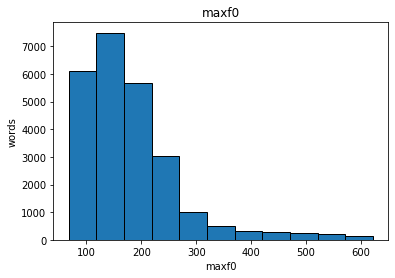

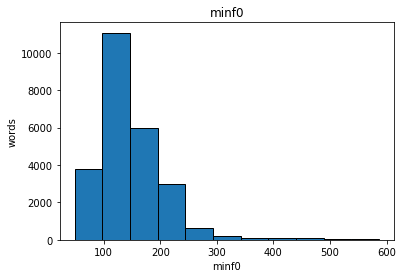

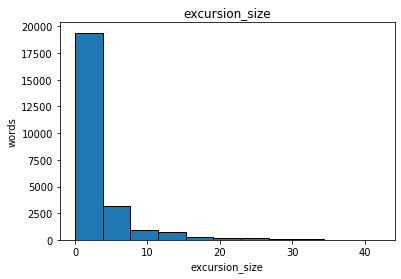

/Users/the-imitation-gamer/anaconda3/lib/python3.7/site-packages/numpy/lib/histograms.py:824: RuntimeWarning: invalid value encountered in greater_equal
  keep = (tmp_a >= first_edge)
/Users/the-imitation-gamer/anaconda3/lib/python3.7/site-packages/numpy/lib/histograms.py:825: RuntimeWarning: invalid value encountered in less_equal
  keep &= (tmp_a <= last_edge)


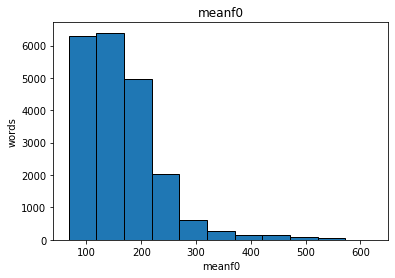

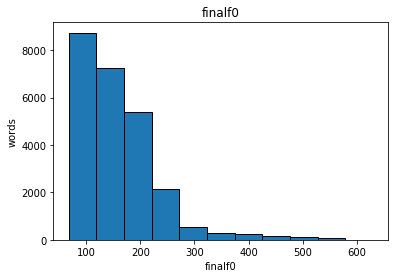

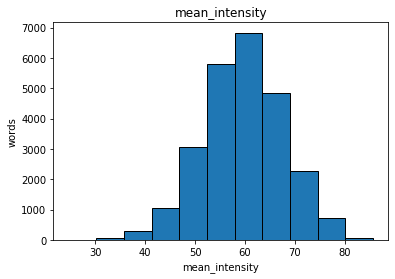

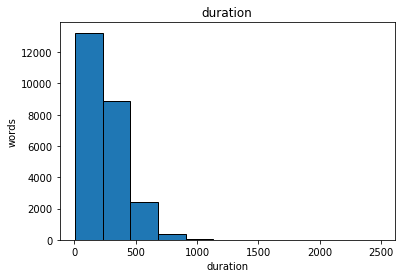

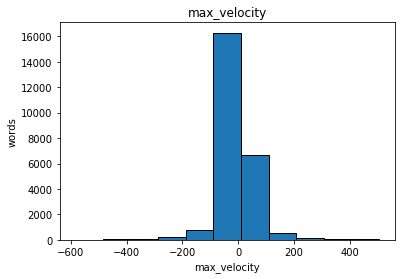

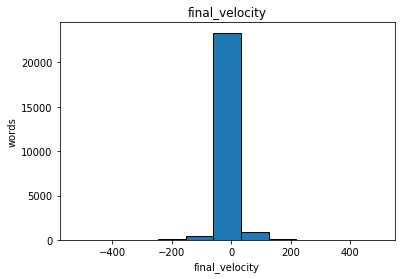

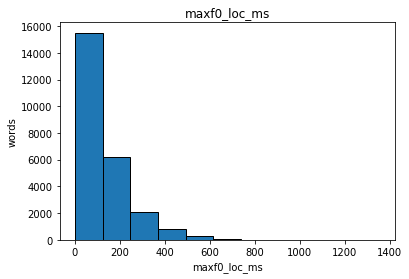

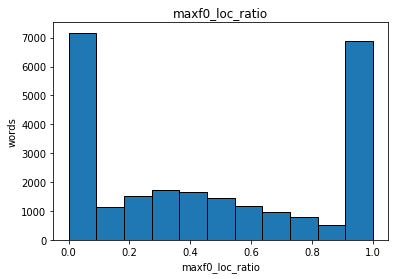

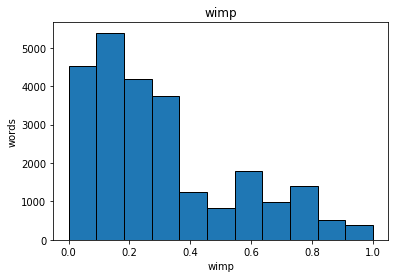

In [334]:
for feature in data_nan.columns[1:13]:
    plt.figure()
    plt.title(feature)
    plt.hist(data_nan[feature], 11, edgecolor='black')
    plt.xlabel(feature)
    plt.ylabel('words')
    plt.show()
#     plt.savefig('../result/stats/'+feature+".jpg", dpi=200)

In [320]:
data_nan.wimp.describe()

count    24994.000000
mean         0.285314
std          0.264039
min          0.000000
25%          0.100000
50%          0.200000
75%          0.400000
max          1.000000
Name: wimp, dtype: float64

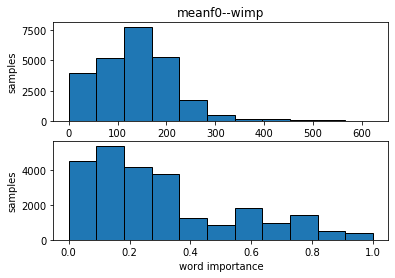

In [15]:
# params (row_num, col_num, index)
plt.subplot(2, 1, 1)
plt.title("meanf0--wimp")

# params (data, bin, edgecolor)
plt.hist(data.meanf0, 11, edgecolor='black')

plt.xlabel("meanf0(Hz)")
plt.ylabel("samples")

plt.subplot(2, 1, 2)
plt.hist(data.wimp, 11, edgecolor='black')
plt.xlabel("word importance")
plt.ylabel("samples")
plt.show()

1. x axis sub-range
2. normalise x axis
3. density

## Sampling

In [365]:
data_sample = data_nan.sample(frac=0.2, random_state=1)

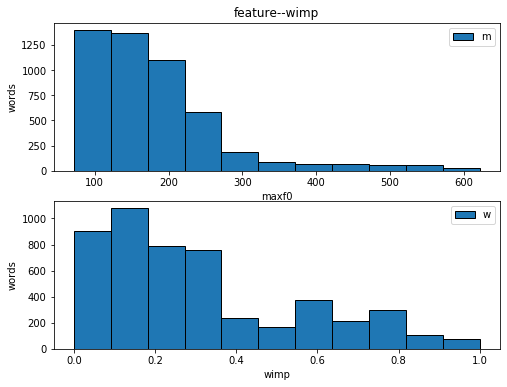

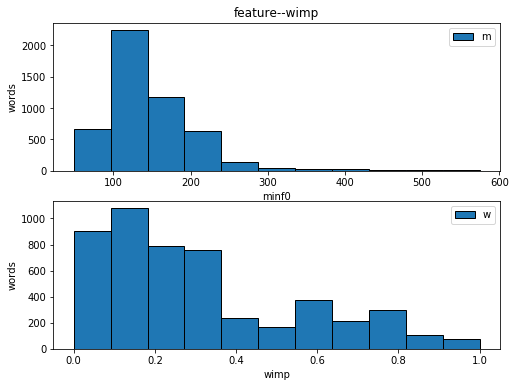

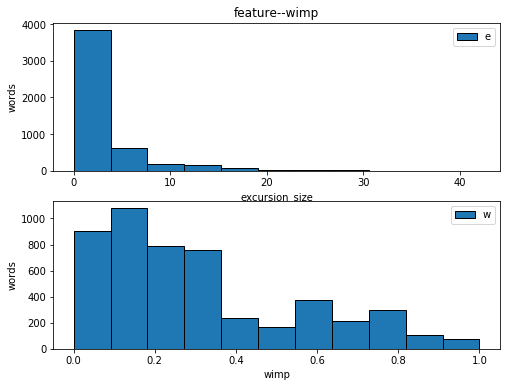

/Users/the-imitation-gamer/anaconda3/lib/python3.7/site-packages/numpy/lib/histograms.py:824: RuntimeWarning: invalid value encountered in greater_equal
  keep = (tmp_a >= first_edge)
/Users/the-imitation-gamer/anaconda3/lib/python3.7/site-packages/numpy/lib/histograms.py:825: RuntimeWarning: invalid value encountered in less_equal
  keep &= (tmp_a <= last_edge)


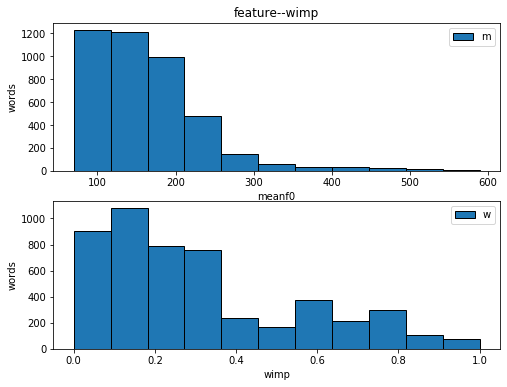

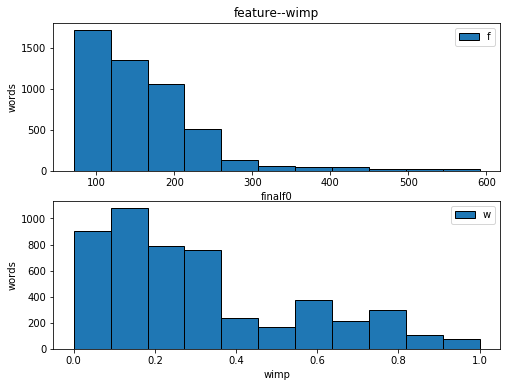

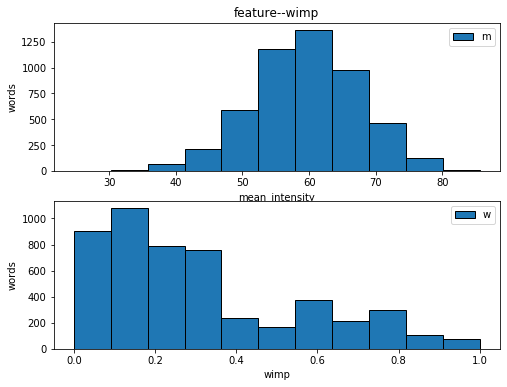

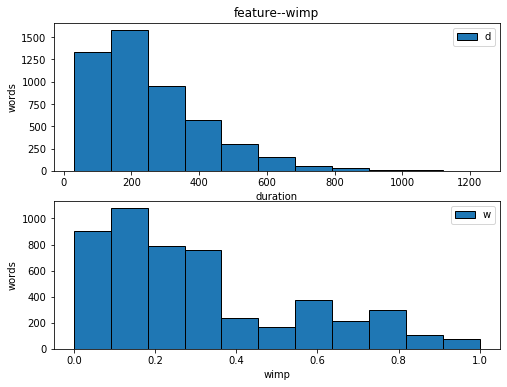

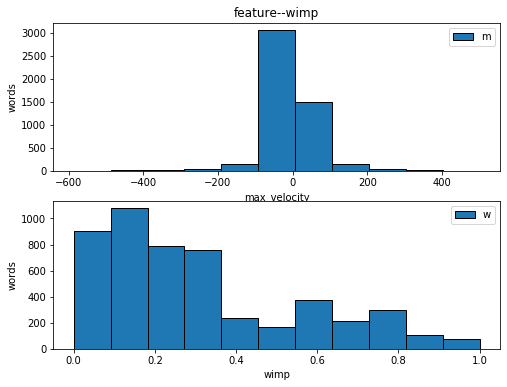

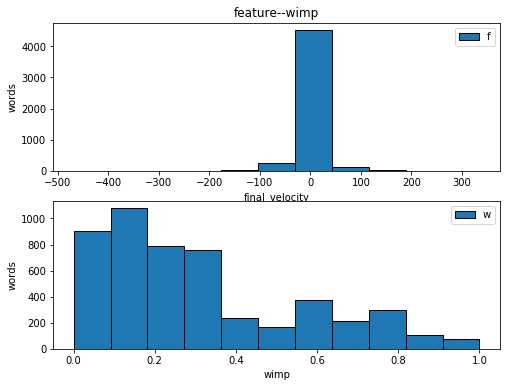

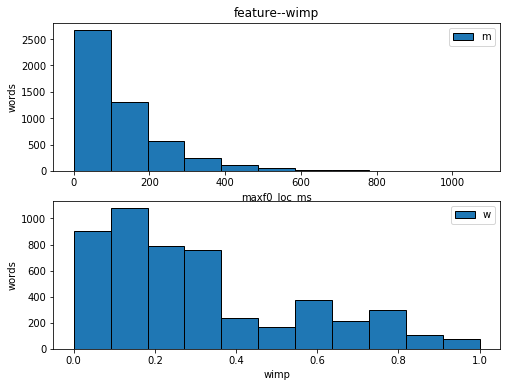

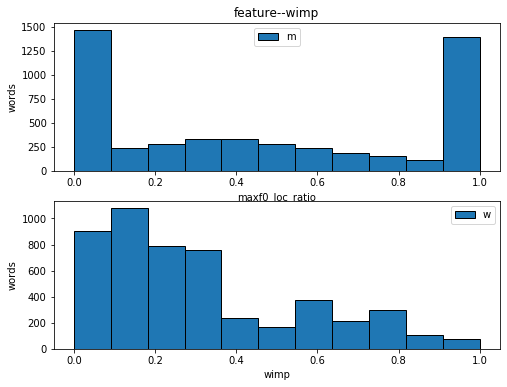

In [366]:
for feature in data_sample.columns[1:12]:
    plt.figure(figsize=(8,6))

    # params (row_num, col_num, index)
    plt.subplot(2, 1, 1)
    plt.title("feature--wimp")
    
    # params (data, bin, edgecolor)
    plt.hist(data_sample[feature], 11, density= False,edgecolor='black')
    
    plt.xlabel(feature)
    plt.ylabel("words")
    plt.legend(feature)
    
    plt.subplot(2, 1, 2)
    plt.hist(data_sample['wimp'], 11, density= False, edgecolor='black')
    plt.xlabel('wimp')
    plt.ylabel("words")
    plt.legend("wimp")
    
    plt.show()

finished data cleaning

# Building Language Models

## Word predictability

In [429]:
import re

In [554]:
with open('../switchboard_word_alignments/swb_ms98_transcriptions/20/2005/sw2005A-ms98-a-trans.text') as f:
    corpus = f.readlines()
#     print(f.readlines())
corpus

['sw2005A-ms98-a-0001 0.000000 11.287375 okay uh first um i need to know uh h[ow]- how do you feel about uh about sending um an elderly uh family member to a nursing home\n',
 'sw2005A-ms98-a-0002 11.287375 20.980875 [silence]\n',
 'sw2005A-ms98-a-0003 20.980875 22.967750 yes yeah\n',
 'sw2005A-ms98-a-0004 22.967750 31.236750 [silence]\n',
 'sw2005A-ms98-a-0005 31.236750 32.954250 um-hum\n',
 'sw2005A-ms98-a-0006 32.954250 44.481250 [silence]\n',
 'sw2005A-ms98-a-0007 44.481250 46.442250 yes\n',
 'sw2005A-ms98-a-0008 46.442250 77.444750 [silence]\n',
 'sw2005A-ms98-a-0009 77.444750 78.996375 yeah\n',
 'sw2005A-ms98-a-0010 78.996375 85.984375 [silence]\n',
 'sw2005A-ms98-a-0011 85.984375 87.465875 yeah\n',
 'sw2005A-ms98-a-0012 87.465875 97.971250 [silence]\n',
 'sw2005A-ms98-a-0013 97.971250 112.239500 um-hum yeah probably the hardest thing in in my family uh my grandmother she had to be put in nursing home and um she had used a walker for for quite sometime probably about six to nine 

In [548]:
# test trans 2005B

# pd failed to help extract sentences from the text file

sents = pd.read_csv('/Users/the-imitation-gamer/Documents/SLP/Msc_Dissertation/data/sw2005B.means', sep='\s+', engine='python')
sents.index = sents["rowLabel"]
sents.drop('rowLabel', axis=1, inplace=True)
sents.drop(['[silence]'], inplace=True)
index = list(sents.index)
index2 = re.findall('([A-Za-z\'\-\[\]]+)\s', test_str)
for item in index:
    if item not in index2:
        print(item)
# type(index)
# print(len(re.findall('([A-Za-z\'\-\[\]]+)\s', test_str)))

them_1


In [553]:
corpus[0]

'sw2005B-ms98-a-0001 0.000000 10.442500 [silence]\n'

In [478]:
corpus[1]

"sw2005B-ms98-a-0002 10.442500 21.679000 well of course it's you know it's it one of the last few things in the world you'd ever want to do you know unless it's just you know really you know f[or]- and for their uh you know for their own good\n"

## Creating corpus

In [7]:
import re

In [448]:
# create the corpus

def get_all_sents(trans_paths, stemming=True):
    all_sents = []
    for txt in (trans_paths):
        with open(txt) as f:
            trans = f.readlines()
    
        sent_list = []
        for sent in trans:
            sent = re.findall(r'([A-Za-z\'\-\_\[\]/{}]+)\s', sent)
            
            if stemming==True:
                st=LancasterStemmer()
                sent=[st.stem(word) for word in sent]
            

            sent_list.append(sent)
            
        all_sents.append(sent_list)
    return all_sents

In [464]:
def get_corpus(trans_paths, stemming=True):
    corpus = []
    for txt in (trans_paths):
        with open(txt) as f:
            trans = f.readlines()
    
        for sent in trans:
            sent = re.findall(r'([A-Za-z\'\-\_\[\]/{}]+)\s', sent)
            

        
            # stemming
            if stemming==True:
                st=LancasterStemmer()
                sent=[st.stem(word) for word in sent]
            
            for word in sent:
                corpus.append(word)
            
    return corpus

In [462]:
trans_path = sorted(glob.glob("../switchboard_word_alignments/*/*/*/*trans.text"))

In [463]:
len(trans_path)

4876

In [465]:
all_sents=get_all_sents(trans_path, stemming=False)

In [466]:
len(all_sents)

4876

In [455]:
all_sents[0]

[['[silence]'],
 ['hi',
  'um',
  'yeah',
  "i'd",
  'like',
  'to',
  'talk',
  'about',
  'how',
  'you',
  'dress',
  'for',
  'work',
  'and',
  'and',
  'um',
  'what',
  'do',
  'you',
  'normally',
  'what',
  'type',
  'of',
  'outfit',
  'do',
  'you',
  'normally',
  'have',
  'to',
  'wear'],
 ['[silence]'],
 ['um-hum'],
 ['[silence]'],
 ['and', 'is'],
 ['[silence]'],
 ['right',
  'right',
  'is',
  'there',
  'is',
  'there',
  'um',
  'an[y]-',
  'is',
  'there',
  'a',
  'like',
  'a',
  'code',
  'of',
  'dress',
  'where',
  'you',
  'work',
  'do',
  'they',
  'ask'],
 ['right'],
 ['[silence]'],
 ['[noise]', 'right'],
 ['[silence]'],
 ['right',
  'right',
  'and',
  'does',
  'it',
  'does',
  'it',
  'change',
  'i',
  'guess',
  'um',
  'you',
  'can',
  'can',
  'you',
  'judge',
  'like',
  '[noise]',
  'depending',
  'on',
  'what',
  'you',
  'think',
  "you'll",
  'be',
  'doing',
  'that',
  'day'],
 ['[silence]'],
 ['right'],
 ['[silence]'],
 ['yes', '[laughte

In [6]:
# get words form word trans

data = pd.read_csv('/Users/the-imitation-gamer/Documents/SLP/Msc_Dissertation/switchboard_word_alignments/swb_ms98_transcriptions/20/2001/sw2001A-ms98-a-word.text', sep='\s+', header = None, engine='python')

In [511]:
data.head(5)

,0,1,2,3
0,sw2001A-ms98-a-0001,0.000000,0.977625,[silence]
1,sw2001A-ms98-a-0002,0.977625,1.215250,[silence]
2,sw2001A-ms98-a-0002,1.215250,1.724625,hi
3,sw2001A-ms98-a-0002,1.724625,2.273625,[silence]
4,sw2001A-ms98-a-0002,2.273625,2.927625,um


In [9]:
words = []
for f in sorted(glob.glob("../switchboard_word_alignments/*/*/*/*word.text")):
    word = pd.read_csv(f, sep= "\s+") 
    word = word.to_numpy()[:, 3]   
    words.append(word)
words

[array(['[silence]', 'hi', '[silence]', 'um', '[silence]', 'yeah', "i'd",
        'like', 'to', 'talk', 'about', '[silence]', 'how', 'you', 'dress',
        '[silence]', 'for', 'work', 'and', 'and', 'um', '[silence]',
        'what', 'do', 'you', 'normally', 'what', 'type', 'of', 'outfit',
        'do', 'you', 'normally', 'have', 'to', 'wear', '[silence]',
        '[silence]', '[silence]', 'um-hum', '[silence]', '[silence]',
        '[silence]', 'and', 'is', '[silence]', '[silence]', '[silence]',
        'right', 'right', 'is', 'there', 'is', 'there', 'um', '[silence]',
        'an[y]-', 'is', 'there', 'a', 'like', 'a', 'code', 'of', 'dress',
        'where', 'you', 'work', 'do', 'they', 'ask', '[silence]',
        '[silence]', 'right', '[silence]', '[silence]', '[silence]',
        '[noise]', 'right', '[silence]', '[silence]', '[silence]', 'right',
        'right', '[silence]', 'and', 'does', 'it', 'does', 'it', 'change',
        'i', 'guess', 'um', 'you', 'can', 'can', 'you', 'judge'

In [11]:
corpus = []
for tran in words:
    for term in tran:
        corpus.append(term)
print(len(corpus))
print(corpus[:100])

4046330
['[silence]', 'hi', '[silence]', 'um', '[silence]', 'yeah', "i'd", 'like', 'to', 'talk', 'about', '[silence]', 'how', 'you', 'dress', '[silence]', 'for', 'work', 'and', 'and', 'um', '[silence]', 'what', 'do', 'you', 'normally', 'what', 'type', 'of', 'outfit', 'do', 'you', 'normally', 'have', 'to', 'wear', '[silence]', '[silence]', '[silence]', 'um-hum', '[silence]', '[silence]', '[silence]', 'and', 'is', '[silence]', '[silence]', '[silence]', 'right', 'right', 'is', 'there', 'is', 'there', 'um', '[silence]', 'an[y]-', 'is', 'there', 'a', 'like', 'a', 'code', 'of', 'dress', 'where', 'you', 'work', 'do', 'they', 'ask', '[silence]', '[silence]', 'right', '[silence]', '[silence]', '[silence]', '[noise]', 'right', '[silence]', '[silence]', '[silence]', 'right', 'right', '[silence]', 'and', 'does', 'it', 'does', 'it', 'change', 'i', 'guess', 'um', 'you', 'can', 'can', 'you', 'judge', 'like']


In [12]:
outF = open('../data/corpus_word.txt', 'w')
for line in corpus:
    outF.write(line)
    outF.write("\n")
outF.close()

In [467]:
corpus = get_corpus(trans_path, stemming=False)

In [468]:
len(corpus)

3251423

In [276]:
# '[silence]', '[noise]', '[laughter]' removed

len(corpus)

3040656

In [469]:
trans_path = sorted(glob.glob("../switchboard_word_alignments/*/*/*/*word.text"))

In [470]:
corpus = get_corpus(trans_path, stemming=False)
print(len(corpus))

# huge difference between word trans and sent trans

4043318


In [471]:
corpus[:50]

['[silence]',
 '[silence]',
 'hi',
 '[silence]',
 'um',
 '[silence]',
 'yeah',
 "i'd",
 'like',
 'to',
 'talk',
 'about',
 '[silence]',
 'how',
 'you',
 'dress',
 '[silence]',
 'for',
 'work',
 'and',
 'and',
 'um',
 '[silence]',
 'what',
 'do',
 'you',
 'normally',
 'what',
 'type',
 'of',
 'outfit',
 'do',
 'you',
 'normally',
 'have',
 'to',
 'wear',
 '[silence]',
 '[silence]',
 '[silence]',
 'um-hum',
 '[silence]',
 '[silence]',
 '[silence]',
 'and',
 'is',
 '[silence]',
 '[silence]',
 '[silence]',
 'right']

In [472]:
outF = open('../data/corpus_word.txt', 'w')
for line in corpus:
    outF.write(line)
    outF.write("\n")
outF.close()

In [10]:
trans_paths = sorted(glob.glob('../switchboard_word_alignments/*/*/*/*trans.text'))
print(trans_paths[:10])
print(len(trans_paths))

['../switchboard_word_alignments/swb_ms98_transcriptions/20/2001/sw2001A-ms98-a-trans.text', '../switchboard_word_alignments/swb_ms98_transcriptions/20/2001/sw2001B-ms98-a-trans.text', '../switchboard_word_alignments/swb_ms98_transcriptions/20/2005/sw2005A-ms98-a-trans.text', '../switchboard_word_alignments/swb_ms98_transcriptions/20/2005/sw2005B-ms98-a-trans.text', '../switchboard_word_alignments/swb_ms98_transcriptions/20/2006/sw2006A-ms98-a-trans.text', '../switchboard_word_alignments/swb_ms98_transcriptions/20/2006/sw2006B-ms98-a-trans.text', '../switchboard_word_alignments/swb_ms98_transcriptions/20/2007/sw2007A-ms98-a-trans.text', '../switchboard_word_alignments/swb_ms98_transcriptions/20/2007/sw2007B-ms98-a-trans.text', '../switchboard_word_alignments/swb_ms98_transcriptions/20/2008/sw2008A-ms98-a-trans.text', '../switchboard_word_alignments/swb_ms98_transcriptions/20/2008/sw2008B-ms98-a-trans.text']
4876


In [13]:
corpus = get_corpus(trans_paths)

In [14]:
len(corpus)

3083622

In [15]:
outF = open('../data/corpus.txt', 'w')
for line in corpus:
    outF.write(line)
    outF.write("\n")
outF.close()

In [16]:
del line, outF

## Stemming

In [26]:
import nltk
from nltk import word_tokenize
from nltk.util import ngrams

In [25]:
from nltk.stem.lancaster import LancasterStemmer

In [588]:
st=LancasterStemmer()
corpus_stem = []
for sent in sent_list:
    stemmedWords=[st.stem(word) for word in sent]
    print(stemmedWords)
    corpus_stem.append(stemmedWords)

['<s>', 'okay', 'uh', 'first', 'um', 'i', 'nee', 'to', 'know', 'uh', 'h[ow]-', 'how', 'do', 'you', 'feel', 'about', 'uh', 'about', 'send', 'um', 'an', 'eld', 'uh', 'famy', 'memb', 'to', 'a', 'nurs', 'hom']
['<s>', 'ye', 'yeah']
['<s>', 'um-h']
['<s>', 'ye']
['<s>', 'yeah']
['<s>', 'yeah']
['<s>', 'um-h', 'yeah', 'prob', 'the', 'hardest', 'thing', 'in', 'in', 'my', 'famy', 'uh', 'my', 'grandmoth', 'she', 'had', 'to', 'be', 'put', 'in', 'nurs', 'hom', 'and', 'um', 'she', 'had', 'us', 'a', 'walk', 'for', 'for', 'quit', 'sometim', 'prob', 'about', 'six', 'to', 'nin', 'month', 'and', 'um']
['<s>', 'she', 'had', 'a', 'fal', 'and', 'uh', 'fin', 'uh', 'she', 'had', 'uh', "parkinson's", 'diseas', 'and', 'it', 'got', 'so', 'much', 'that', 'she', 'could', 'not', 'tak', 'car', 'of', 'her', 'hous', 'sh[e]-', 'then', 'she', 'liv', 'in', 'an', 'apart', 'and', 'um']
['<s>', 'that', 'was', 'ev', 'hard', 'act', 'becaus', 'it', 'was', 'you', 'know', 'it', 'was', 'just', 'a', 'chang', 'of']
['<s>', 'chang

In [3]:
with open('../data/corpus_no_special_chars.txt', 'r') as f:
    corpus = f.readlines()
    corpus = [word[:-1] for word in corpus]
    st=LancasterStemmer()
    corpus=[st.stem(word) for word in corpus]

In [12]:
st=LancasterStemmer()
corpus=[st.stem(word) for word in corpus]

In [13]:
corpus[50:100]

['work',
 'do',
 'they',
 'ask',
 'right',
 'right',
 'right',
 'right',
 'and',
 'doe',
 'it',
 'doe',
 'it',
 'chang',
 'i',
 'guess',
 'um',
 'you',
 'can',
 'can',
 'you',
 'judg',
 'lik',
 'depend',
 'on',
 'what',
 'you',
 'think',
 "you'll",
 'be',
 'doing',
 'that',
 'day',
 'right',
 'ye',
 'yeah',
 'yeah',
 'wel',
 "that's",
 'right',
 'and',
 'it',
 'yeah',
 'and',
 'it',
 'was',
 'us',
 'uh',
 'also',
 'uh']

In [4]:
with open('./corpus_stem.pkl', 'wb') as f:
    pickle.dump(corpus, f)

## TF-IDF

### sklean

In [63]:
# get doc collections

pf_path = sorted(glob.glob('/Users/the-imitation-gamer/Documents/SLP/Msc_Dissertation/data/pf_means/*/*.means'))
docs = []
for p in pf_path:
    pf_df = pd.read_csv(p, sep="\s+", index_col=0, engine='python')

    special_characters = pf_df.index.str.extractall(r'(?P<square>.*\[.*)')

    pf_df.drop(special_characters.square, inplace=True)
    
    doc = list(pf_df.index)
#     docs -- list of str
    doc = " ".join(doc)
    docs.append(doc)


In [75]:

docs

["hi um yeah i'd like to talk about how you dress for work and and um what do you normally what type of outfit do you normally have to wear um-hum and is right right is there is there um is there a like a code of dress where you work do they ask right right right right and does it does it change i guess um you can can you judge like depending on what you think you'll be doing that day right yes yeah yeah well that's right and it yeah and it was usually uh also uh where i was it was um in engineering and and it was it was a casual office there was no formal dress code but um uh usually engineers are expected to to dress you know little more professionally it just in case things would come up during the day sometimes unexpected meetings or a client would come in and wanna see you uh other times it could be very casual if you knew you would be at a desk day and nobody would see you um uh well i was i was in a uh private consulting firm so um and uh and uh anyway um right now i'm not i'm n

In [81]:
with open('./docs.pkl', 'wb') as f:
    pickle.dump(docs, f)

In [67]:
from sklearn.feature_extraction.text import TfidfVectorizer

In [79]:
tfidf_vectorizer = TfidfVectorizer()

In [77]:
# stop words, del from vocab, tfidf requires

tfidf_vectorizer = TfidfVectorizer(stop_words='english')

In [80]:
t0 = time()
tfidf = tfidf_vectorizer.fit_transform(docs)
print("done in %0.3fs." % (time() - t0))

done in 1.511s.


In [82]:
tfidf[0, :]

<1x26041 sparse matrix of type '<class 'numpy.float64'>'
	with 154 stored elements in Compressed Sparse Row format>

In [84]:
tfidf_vectorizer.idf_

array([8.7987282 , 8.10558102, 8.7987282 , ..., 8.7987282 , 8.7987282 ,
       8.7987282 ])

In [85]:
tfidf_vectorizer.vocabulary_

{'hi': 10700,
 'um': 24287,
 'yeah': 25921,
 'like': 13190,
 'to': 23601,
 'talk': 22950,
 'about': 90,
 'how': 11039,
 'you': 25963,
 'dress': 7107,
 'for': 9044,
 'work': 25776,
 'and': 873,
 'what': 25483,
 'do': 6866,
 'normally': 15404,
 'type': 24245,
 'of': 15639,
 'outfit': 15929,
 'have': 10498,
 'wear': 25369,
 'hum': 11079,
 'is': 12100,
 'right': 19501,
 'there': 23361,
 'code': 4382,
 'where': 25502,
 'they': 23373,
 'ask': 1304,
 'does': 6898,
 'it': 12129,
 'change': 3765,
 'guess': 10164,
 'can': 3324,
 'judge': 12363,
 'depending': 6211,
 'on': 15723,
 'think': 23390,
 'll': 13326,
 'be': 1954,
 'doing': 6908,
 'that': 23320,
 'day': 5876,
 'yes': 25939,
 'well': 25446,
 'was': 25285,
 'usually': 24723,
 'uh': 24277,
 'also': 735,
 'in': 11401,
 'engineering': 7732,
 'casual': 3570,
 'office': 15659,
 'no': 15316,
 'formal': 9106,
 'but': 3148,
 'engineers': 7733,
 'are': 1180,
 'expected': 8166,
 'know': 12668,
 'little': 13307,
 'more': 14735,
 'professionally': 1777

In [96]:
tfidf[0, 10700]

array(0.04987784)

In [87]:
pf_path = sorted(glob.glob('/Users/the-imitation-gamer/Documents/SLP/Msc_Dissertation/data/pf_means/*/*.means'))

In [88]:
features = concat_features(pf_path)

In [ ]:
term_dict = tfidf_vectorizer.vocabulary_

In [ ]:
words = list(features[0].index)

print(word for word in words if word not in keys)

In [101]:
'hi' in keys

True

In [ ]:
tfidfs = []
for i in range(len(features)):
    words = list(features[i].index)
    for j in range(len(words)):
        idx_w = term_dict[words[j]]
        tfidf_w = tfidf[i, idx_w]
        tfidfs.append(tfidf_w)

In [105]:
t0 = time()

tfidfs = []
words = list(features[0].index)
words = [word.strip('\n') for word in words]

for j in range(len(words)):
    idx_w = term_dict[words[j]]
    tfidf_w = tfidf[0, idx_w]
    print(tfidf_w)
    tfidfs.append(tfidf_w)

print("done in %0.3fs." % (time() - t0))

0.049877844739044344
0.2403278986577357
0.12201353899963642


KeyError: "i'd"

## Unigram

In [17]:
from math import *

In [4]:
def uni_prob(p_features, corpus):
    p_features = p_features
    corpus = corpus
    unigram = get_ngram(corpus, 1)
    words = list(p_features.index)
    st=LancasterStemmer()
    words =[st.stem(word) for word in words]
    
    prob = []
#     for token in words:
#         prob1.append(unigram[token]/len(corpus))
    for token in words:
        if unigram[token] != 0:
            prob.append(log(unigram[token]/len(corpus)))  
        
        else:
            prob.append(np.nan)
    
    prob_df = pd.DataFrame(prob, columns=['prob'])
    prob_df.index = words
#     round to 3 decimal places, saving executation time?
    prob_df = prob_df.round(3)
    return prob_df

In [140]:
uni_prob(p_features, corpus).head(10)

,prob
hi,-9.721260
um,-4.980048
yeah,-4.176885
i'd,-7.411135
lik,-4.846021
to,-3.778602
talk,-6.839029
about,-5.573332
how,-6.231985
you,-3.638325


In [6]:
unigram = Counter(corpus)

In [13]:
# get unigram word prob

words = list(features.index)
words = [st.stem(word) for word in words]
prob = []
for token in words:
    if unigram[token] != 0:
        prob.append(log(unigram[token]/len(corpus)))  
        
    else:
        prob.append(np.nan)

In [14]:
len(prob)

3046586

In [53]:
# get unigram word prob

def get_prob(features, unigram):
    words = list(features.index)
    words = [st.stem(word) for word in words]
    prob = []
    for token in words:
        if unigram[token] != 0:
            prob.append(log(unigram[token]/len(corpus)))  
            
        else:
            prob.append(np.nan)
    prob = np.array(prob)
    
    return prob

In [15]:
# unigram for the corpus

c_uni = Counter(corpus_flat)
print(c_uni)

Counter({'i': 118103, 'and': 108696, 'the': 97515, 'you': 81088, 'a': 72630, 'to': 70475, 'uh': 69814, 'that': 66114, 'it': 55764, 'of': 55011, 'know': 48381, 'yeah': 47322, 'in': 40080, 'on': 33356, 'they': 32992, 'hav': 30930, 'but': 28979, "it's": 27382, 'so': 27145, 'we': 25379, 'is': 24448, 'lik': 24236, 'was': 23850, 'wel': 22590, 'just': 22426, 'um': 21196, "that's": 20848, 'do': 20671, 'for': 20050, 'think': 20010, 'real': 18950, "don't": 18897, 'oh': 18825, 'or': 16930, 'right': 16903, 'uh-huh': 16294, 'um-h': 16006, 'not': 14970, 'get': 14965, 'my': 14924, 'what': 14923, 'be': 14094, 'with': 13950, 'ar': 13316, 'if': 13236, 'ther': 12842, "i'm": 12356, 'al': 12052, 'about': 11711, 'thing': 11679, 'out': 11034, 'at': 11008, 'had': 10912, 'as': 10082, 'up': 9935, 'lot': 9771, 'thi': 9660, 'when': 9591, 'he': 9577, 'som': 8987, 'then': 8863, 'us': 8842, 'can': 8794, 'peopl': 8766, 'go': 8724, 'got': 8679, 'tim': 8547, 'good': 8533, 'her': 8515, 'kind': 8488, 'mean': 8484, 'becau

In [697]:
c_uni.most_common(100)

[('i', 118103),
 ('and', 108696),
 ('the', 97515),
 ('you', 81088),
 ('a', 72630),
 ('to', 70475),
 ('uh', 69814),
 ('that', 66114),
 ('it', 55764),
 ('of', 55011),
 ('know', 48381),
 ('yeah', 47322),
 ('in', 40080),
 ('on', 33356),
 ('they', 32992),
 ('hav', 30930),
 ('but', 28979),
 ("it's", 27382),
 ('so', 27145),
 ('we', 25379),
 ('is', 24448),
 ('lik', 24236),
 ('was', 23850),
 ('wel', 22590),
 ('just', 22426),
 ('um', 21196),
 ("that's", 20848),
 ('do', 20671),
 ('for', 20050),
 ('think', 20010),
 ('real', 18950),
 ("don't", 18897),
 ('oh', 18825),
 ('or', 16930),
 ('right', 16903),
 ('uh-huh', 16294),
 ('um-h', 16006),
 ('not', 14970),
 ('get', 14965),
 ('my', 14924),
 ('what', 14923),
 ('be', 14094),
 ('with', 13950),
 ('ar', 13316),
 ('if', 13236),
 ('ther', 12842),
 ("i'm", 12356),
 ('al', 12052),
 ('about', 11711),
 ('thing', 11679),
 ('out', 11034),
 ('at', 11008),
 ('had', 10912),
 ('as', 10082),
 ('up', 9935),
 ('lot', 9771),
 ('thi', 9660),
 ('when', 9591),
 ('he', 9577)

# Computing Correlation

## Spearman Correlation Coefficient

### word importance data

In [257]:
pfs_wimps_df = pd.read_csv('../data/csv/pfs_wimps_NaN_float64.csv', index_col=0)
pfs_wimps_df.head()

,maxf0,minf0,excursion_size,meanf0,finalf0,mean_intensity,duration,max_velocity,final_velocity,maxf0_loc_ms,maxf0_loc_ratio,wimp
rowLabel,,,,,,,,,,,,
okay,122.699389,90.780426,5.216099,103.083299,91.706489,60.149844,480.00,-41.226733,6.073829,46.972989,0.097860,0.0
uh,100.410428,90.356305,1.826543,91.828157,91.554214,57.829029,220.00,50.256391,37.407694,220.000000,1.000000,0.0
first,172.511288,100.410428,9.369380,163.575022,145.482690,65.686393,485.00,50.446048,-14.411732,264.641866,0.545653,0.2
um,141.971196,110.558641,4.329438,120.552135,115.269896,64.533326,497.25,-26.032538,4.460641,0.000000,0.000000,0.0
i,132.801350,123.166390,1.303934,127.121156,127.119726,59.967700,116.75,34.580378,18.205977,116.750000,1.000000,0.1


In [260]:
# orginal data with 3 special words removed 

corr_s_l = []
corr_p_l = []
for feature in pfs_wimps_df.columns[0:11]:
    print('\n' + feature)
    feature_np = pfs_wimps_df[feature].to_numpy()
    wimp_np = pfs_wimps_df.wimp.to_numpy()
#     feature_np[np.isnan(feature_np)] = 0.00001
    corr_s = spearmanr(feature_np, wimp_np)
    corr_s_l.append(corr_s[0])
    print('spearman: ', corr_s)
    corr_p = pearsonr(feature_np, wimp_np)
    corr_p_l.append(corr_p[0])
    print('pearson: ', corr_p)


maxf0
spearman:  SpearmanrResult(correlation=0.0644983521555278, pvalue=1.8451980692639606e-24)
pearson:  (0.046258688617632604, 2.5392727044048136e-13)

minf0
spearman:  SpearmanrResult(correlation=-0.044529278066975576, pvalue=1.881531613094224e-12)
pearson:  (-0.054366070830352164, 7.907270466959548e-18)

excursion_size
spearman:  SpearmanrResult(correlation=0.25064291611938083, pvalue=0.0)
pearson:  (0.16020604797238108, 2.4615789751978843e-143)

meanf0
spearman:  SpearmanrResult(correlation=0.12114658502194052, pvalue=2.3976605123833153e-82)
pearson:  (0.11008354768805459, 3.1071534581705587e-68)

finalf0
spearman:  SpearmanrResult(correlation=-0.005176698582731547, pvalue=0.41314352691950873)
pearson:  (-0.013776039473066357, 0.02941228304215847)

mean_intensity
spearman:  SpearmanrResult(correlation=0.11609965825126496, pvalue=9.749418317685269e-76)
pearson:  (0.11254300094944755, 2.979037935240079e-71)

duration
spearman:  SpearmanrResult(correlation=0.4705666039348637, pvalue

In [53]:
corr_s_l = []
corr_p_l = []
for feature in pfs_wimps_df.columns[0:11]:
    print('\n' + feature)
    feature_np = pfs_wimps_df[feature].to_numpy()
    wimp_np = pfs_wimps_df.wimp.to_numpy()
    feature_np[np.isnan(feature_np)] = 0.00001
    corr_s = spearmanr(feature_np, wimp_np)
    corr_s_l.append(corr_s[0])
    print('spearman: ', corr_s)
    corr_p_l.append(corr_s[1])


maxf0
spearman:  SpearmanrResult(correlation=0.06597077464953574, pvalue=3.7375472886943812e-25)

minf0
spearman:  SpearmanrResult(correlation=-0.04460117570668473, pvalue=2.549787286693516e-12)

excursion_size
spearman:  SpearmanrResult(correlation=0.25365468740609887, pvalue=0.0)

meanf0
spearman:  SpearmanrResult(correlation=0.12327079212597376, pvalue=6.008208901031909e-84)

finalf0
spearman:  SpearmanrResult(correlation=-0.005015423025152339, pvalue=0.431383052273548)

mean_intensity
spearman:  SpearmanrResult(correlation=0.11802610442888664, pvalue=4.58134799651395e-77)

duration
spearman:  SpearmanrResult(correlation=0.47772404745094993, pvalue=0.0)

max_velocity
spearman:  SpearmanrResult(correlation=-0.0712869912455926, pvalue=4.1803972332467136e-29)

final_velocity
spearman:  SpearmanrResult(correlation=-0.06337461438541346, pvalue=2.4655076920076847e-23)

maxf0_loc_ms
spearman:  SpearmanrResult(correlation=0.23337589283683693, pvalue=1.0729418825753442e-301)

maxf0_loc_rati

In [54]:
result = pd.DataFrame(np.array([corr_s_l, corr_p_l]),
...                    columns=['maxf0', 'minf0', 'excursion_size', 'meanf0','finalf0','mean_intensity', 'duration', 'max_velocity','final_velocity', 'maxf0_loc_ms', 'maxf0_loc_ratio'])

In [55]:
result.index=['Spearman', 'pvalue']

In [56]:
result = result.round(3)

In [57]:
result.head()

,maxf0,minf0,excursion_size,meanf0,finalf0,mean_intensity,duration,max_velocity,final_velocity,maxf0_loc_ms,maxf0_loc_ratio
Spearman,0.066,-0.045,0.254,0.123,-0.005,0.118,0.478,-0.071,-0.063,0.233,-0.013
pvalue,0.000,0.000,0.000,0.000,0.431,0.000,0.000,0.000,0.000,0.000,0.036


In [14]:
result.to_csv('../result/wimp_corr_p.csv')

NameError: name 'result' is not defined

histograph of velovity in absolute values

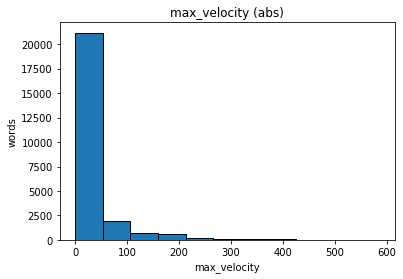

In [271]:
plt.figure()
plt.hist(pfs_wimps_df.max_velocity.abs(), 11, edgecolor='black')
plt.title('max_velocity (abs)')
plt.xlabel('max_velocity')
plt.ylabel('words')
plt.show()

In [273]:
# abs vs non-abs

corr_s_l = []
corr_p_l = []
for feature in pfs_wimps_df.columns[7:9]:
    print('\n' + feature)
    feature_np = pfs_wimps_df[feature].to_numpy()
    wimp_np = pfs_wimps_df.wimp.to_numpy()
#     feature_np[np.isnan(feature_np)] = 0.00001
    corr_s = spearmanr(feature_np, wimp_np)
    print('spearman: ', corr_s)
    corr_s_l.append(corr_s[0])
    corr_s_abs = spearmanr(np.absolute(feature_np), wimp_np)
    corr_s_l.append(corr_s_abs[0])
    print('spearman_abs: ', corr_s_abs)
    
    corr_p = pearsonr(feature_np, wimp_np)
    corr_p_l.append(corr_p[0])
    print('pearson: ', corr_p)
    corr_p_abs = pearsonr(np.absolute(feature_np), wimp_np)
    corr_p_l.append(corr_p_abs[0])
    print('pearson_abs: ', corr_p_abs)

result = pd.DataFrame(np.array([corr_s_l, corr_p_l]), index= ['Spearman', 'Pearson'], columns=['max_velocity', 'max_velocity_abs', 'final_velocity', 'final_velocity_abs']).round(3)
result.to_csv('../result/wimp_velocity_abs.csv')


max_velocity
spearman:  SpearmanrResult(correlation=-0.06903210838399854, pvalue=8.647261971621732e-28)
spearman_abs:  SpearmanrResult(correlation=0.14127126341586324, pvalue=1.406482343571035e-111)
pearson:  (-0.03486426052416577, 3.522425265860684e-08)
pearson_abs:  (0.07357771097212315, 2.3637631495796793e-31)

final_velocity
spearman:  SpearmanrResult(correlation=-0.062041372949133845, pvalue=9.476305130052895e-23)
spearman_abs:  SpearmanrResult(correlation=-0.01001476043668689, pvalue=0.11336605578537684)
pearson:  (-0.023414953627331515, 0.0002138161349627181)
pearson_abs:  (-0.00986120486689369, 0.11900437829448676)


In [181]:
for feature in pfs_wimps_df.columns[0:11]:
    print('\n' + feature)
    feature_np = pfs_wimps_df[feature].to_numpy()
    wimp_np = pfs_wimps_df.wimp.to_numpy()
    feature_np[np.isnan(feature_np)] = 0.00001
    corr_s = spearmanr(feature_np, wimp_np)
    print('spearman: ', corr_s)
    corr_p = pearsonr(feature_np, wimp_np)
    print('pearson: ', corr_p)


maxf0
spearman:  SpearmanrResult(correlation=0.04710777492667652, pvalue=2.771520346345053e-07)
pearson:  (0.03478747592734091, 0.00014851381352122447)

minf0
spearman:  SpearmanrResult(correlation=-0.032890154811862006, pvalue=0.00033511376369467776)
pearson:  (-0.045710585591520594, 6.17079704854883e-07)

excursion_size
spearman:  SpearmanrResult(correlation=0.15859818060454453, pvalue=8.25326120702569e-68)
pearson:  (0.11076826441968898, 9.034727364789069e-34)

meanf0
spearman:  SpearmanrResult(correlation=0.07701392674470482, pvalue=4.1619554908845155e-17)
pearson:  (0.07656301368420501, 6.332268539772346e-17)

finalf0
spearman:  SpearmanrResult(correlation=-0.007182203517604611, pvalue=0.43363557792360585)
pearson:  (-0.015416863638181729, 0.09280458273149989)

mean_intensity
spearman:  SpearmanrResult(correlation=0.05915674907055047, pvalue=1.0844190984501072e-10)
pearson:  (0.06745712549345526, 1.8077316160830796e-13)

duration
spearman:  SpearmanrResult(correlation=0.333035798

In [180]:
# absolute value for velocity   

for feature in pfs_wimps_df.columns[0:11]:
    print('\n' + feature)
    if feature == 'max_velocity':
        feature_np = np.absolute(pfs_wimps_df[feature].to_numpy())
    elif feature == 'final_velocity':
        feature_np = np.absolute(pfs_wimps_df[feature].to_numpy())
    else:
        feature = feature
        feature_np = pfs_wimps_df[feature].to_numpy()
    wimp_np = pfs_wimps_df.wimp.to_numpy()
    feature_np[np.isnan(feature_np)] = 0.00001
    corr_s = spearmanr(feature_np, wimp_np)
    print('spearman: ', corr_s)
    corr_p = pearsonr(feature_np, wimp_np)
    print('pearson: ', corr_p)


maxf0
spearman:  SpearmanrResult(correlation=0.04710777492667652, pvalue=2.771520346345053e-07)
pearson:  (0.03478747592734091, 0.00014851381352122447)

minf0
spearman:  SpearmanrResult(correlation=-0.032890154811862006, pvalue=0.00033511376369467776)
pearson:  (-0.045710585591520594, 6.17079704854883e-07)

excursion_size
spearman:  SpearmanrResult(correlation=0.15859818060454453, pvalue=8.25326120702569e-68)
pearson:  (0.11076826441968898, 9.034727364789069e-34)

meanf0
spearman:  SpearmanrResult(correlation=0.07701392674470482, pvalue=4.1619554908845155e-17)
pearson:  (0.07656301368420501, 6.332268539772346e-17)

finalf0
spearman:  SpearmanrResult(correlation=-0.007182203517604611, pvalue=0.43363557792360585)
pearson:  (-0.015416863638181729, 0.09280458273149989)

mean_intensity
spearman:  SpearmanrResult(correlation=0.05915674907055047, pvalue=1.0844190984501072e-10)
pearson:  (0.06745712549345526, 1.8077316160830796e-13)

duration
spearman:  SpearmanrResult(correlation=0.333035798

In [199]:
# all stop words removed   

for feature in pfs_wimps_df.columns[0:11]:
    print('\n' + feature)
    if feature == 'max_velocity':
        feature_np = np.absolute(pfs_wimps_df[feature].to_numpy())
    elif feature == 'final_velocity':
        feature_np = np.absolute(pfs_wimps_df[feature].to_numpy())
    else:
        feature = feature
        feature_np = pfs_wimps_df[feature].to_numpy()
    wimp_np = pfs_wimps_df.wimp.to_numpy()
    feature_np[np.isnan(feature_np)] = 0.00001
    corr_s = spearmanr(feature_np, wimp_np)
    print('spearman: ', corr_s)
    corr_p = pearsonr(feature_np, wimp_np)
    print('pearson: ', corr_p)


maxf0
spearman:  SpearmanrResult(correlation=0.08146554871577909, pvalue=5.191145089524081e-12)
pearson:  (0.0669958424267501, 1.4148389100476903e-08)

minf0
spearman:  SpearmanrResult(correlation=0.009461808042136005, pvalue=0.4236445476290577)
pearson:  (-0.011866254588400918, 0.31564220799919834)

excursion_size
spearman:  SpearmanrResult(correlation=0.1602041697231127, pvalue=2.4758970576959547e-42)
pearson:  (0.114216622680924, 3.3268054211499337e-22)

meanf0
spearman:  SpearmanrResult(correlation=0.1258805312994574, pvalue=1.1700745572230018e-26)
pearson:  (0.1373872063476258, 1.7526405483363501e-31)

finalf0
spearman:  SpearmanrResult(correlation=0.028924560310849796, pvalue=0.014429448790450782)
pearson:  (0.015401742837765766, 0.19275975989480368)

mean_intensity
spearman:  SpearmanrResult(correlation=0.09602697498282783, pvalue=3.9883597527504575e-16)
pearson:  (0.1245736197938708, 3.8818394986886284e-26)

duration
spearman:  SpearmanrResult(correlation=0.2836618133233191, p

In [210]:
# removed inclimation

for feature in pfs_wimps_df.columns[0:11]:
    print('\n' + feature)
    if feature == 'max_velocity':
        feature_np = np.absolute(pfs_wimps_df[feature].to_numpy())
    elif feature == 'final_velocity':
        feature_np = np.absolute(pfs_wimps_df[feature].to_numpy())
    else:
        feature = feature
        feature_np = pfs_wimps_df[feature].to_numpy()
    wimp_np = pfs_wimps_df.wimp.to_numpy()
    feature_np[np.isnan(feature_np)] = 0.00001
    corr_s = spearmanr(feature_np, wimp_np)
    print('spearman: ', corr_s)
    corr_p = pearsonr(feature_np, wimp_np)
    print('pearson: ', corr_p)



maxf0
spearman:  SpearmanrResult(correlation=0.02574452632755079, pvalue=0.009815232592802337)
pearson:  (0.031828009563802585, 0.0014092625281733084)

minf0
spearman:  SpearmanrResult(correlation=-0.05378192306455522, pvalue=6.756124059589875e-08)
pearson:  (-0.04915294901578181, 8.123059667477455e-07)

excursion_size
spearman:  SpearmanrResult(correlation=0.14270036218003104, pvalue=6.4581387074749725e-47)
pearson:  (0.10471901244032406, 6.221760502185625e-26)

meanf0
spearman:  SpearmanrResult(correlation=0.031241366572084563, pvalue=0.0017251692452944255)
pearson:  (0.04748327721826751, 1.891845013871319e-06)

finalf0
spearman:  SpearmanrResult(correlation=-0.028739988600555686, pvalue=0.0039410104537509465)
pearson:  (-0.015868401993736445, 0.1114979899803765)

mean_intensity
spearman:  SpearmanrResult(correlation=0.017728149479347647, pvalue=0.0753965950885754)
pearson:  (0.02812483641003033, 0.004785690080867023)

duration
spearman:  SpearmanrResult(correlation=0.43308146394578

In [42]:
result = correlation(features, wimp, absolute=True)


maxf0
spearman:  SpearmanrResult(correlation=0.06597053859968559, pvalue=3.7389994454114406e-25)

minf0
spearman:  SpearmanrResult(correlation=-0.044600958865138145, pvalue=2.5504074370938753e-12)

excursion_size
spearman:  SpearmanrResult(correlation=0.2536539483740109, pvalue=0.0)

meanf0
spearman:  SpearmanrResult(correlation=0.12327075123019278, pvalue=6.00896790508713e-84)

finalf0
spearman:  SpearmanrResult(correlation=-0.005015421871818564, pvalue=0.4313831582079789)

mean_intensity
spearman:  SpearmanrResult(correlation=0.11802567166203617, pvalue=4.58720912899758e-77)

duration
spearman:  SpearmanrResult(correlation=0.4777495391418872, pvalue=0.0)

max_velocity
spearman:  SpearmanrResult(correlation=0.14290938611389192, pvalue=1.8651497027588273e-112)

final_velocity
spearman:  SpearmanrResult(correlation=-0.011512903869855146, pvalue=0.07088549820003046)

maxf0_loc_ms
spearman:  SpearmanrResult(correlation=0.23337983598576917, pvalue=1.0475286757069936e-301)

maxf0_loc_ratio

In [43]:
result.to_csv('../result/wimp_corr2_abs.csv')

In [16]:
words = list(data.rowLabel)
words =[st.stem(word) for word in words]

In [17]:
prob = [c_uni[ele] for ele in words]
print(len(prob))
print(prob)

24994
[5523, 69814, 2124, 21196, 118103, 2848, 70475, 48381, 69814, 67, 6061, 20671, 81088, 2524, 11711, 69814, 11711, 396, 21196, 5419, 145, 69814, 2034, 184, 70475, 72630, 577, 3695, 4503, 47322, 16006, 4503, 47322, 47322, 16006, 47322, 3935, 97515, 37, 11679, 40080, 40080, 14924, 2034, 69814, 14924, 156, 5478, 10912, 70475, 14094, 3591, 40080, 577, 3695, 108696, 21196, 5478, 10912, 8842, 72630, 810, 20050, 20050, 1793, 1545, 3935, 11711, 1297, 70475, 964, 821, 108696, 21196, 5478, 10912, 72630, 404, 108696, 69814, 1420, 69814, 5478, 10912, 69814, 5, 108, 108696, 55764, 8679, 27145, 5863, 66114, 5478, 3832, 14970, 5193, 5425, 55011, 8515, 2276, 94, 8863, 5478, 3444, 40080, 5419, 370, 108696, 21196, 66114, 23850, 6588, 2012, 3394, 8414, 55764, 23850, 81088, 48381, 55764, 23850, 22426, 72630, 1666, 55011, 1666, 55011, 585, 108696, 55764, 23850, 5089, 34, 20050, 8515, 8414, 5478, 10912, 6405, 27145, 8842, 70475, 353, 118103, 8484, 5478, 1, 5478, 10912, 5478, 10912, 1863, 12052, 319, 975

In [18]:
prob_df = pd.DataFrame(prob, columns=['prob'])
prob_df.head()

,prob
0,5523
1,69814
2,2124
3,21196
4,118103


In [706]:
prob_df.describe()

,prob
count,24994.000000
mean,30702.886973
std,35525.948154
min,0.000000
25%,2653.000000
50%,14923.000000
75%,55011.000000
max,118103.000000


In [707]:
for feature in data.columns[2:14]:
    print(feature)
    print(data[feature].corr(prob_df.prob))

maxf0
-0.05284231258349875
minf0
0.040951933143118284
excursion_size
-0.15034191663583207
meanf0
-0.011447563016315358
finalf0
0.0042895554453236204
mean_intensity
-0.0998593843136432
duration
-0.4218813757354086
max_velocity
0.045514090495279304
final_velocity
0.026490218688287968
maxf0_loc_ms
-0.22668556603725853
maxf0_loc_ratio
0.03897470086450952
wimp
-0.5471791526761981


In [20]:
# spearman corr

for feature in data.columns[2:14]:
    print(feature)
    print(data[feature].corr(prob_df.prob, method='spearman'))
    print(data[feature].corr(prob_df.prob, method='pearson'))

maxf0
-0.07778602743432146
-0.05284231258349875
minf0
0.0450205931684438
0.040951933143118284
excursion_size
-0.2835891484244816
-0.15034191663583207
meanf0
-0.028649531669860232
-0.011447563016315358
finalf0
-3.151337069519851e-05
0.0042895554453236204
mean_intensity
-0.1157471462363455
-0.0998593843136432
duration
-0.5646112258824862
-0.4218813757354086
max_velocity
0.08368789236331324
0.045514090495279304
final_velocity
0.0658540051590363
0.026490218688287968
maxf0_loc_ms
-0.2821643303352316
-0.22668556603725853
maxf0_loc_ratio
0.007689141691029528
0.03897470086450952
wimp
-0.7001972214468667
-0.5471791526761981


In [714]:
%%capture cap --no-stderr
for feature in data.columns[2:14]:
    print(feature)
    print(data[feature].corr(prob_df.prob))

In [734]:

prob = []
for ele in words:
    if c_uni[ele[0]]!= 0:
        prob.append(c_bi[ele]/(c_uni[ele[0]]))
    else:
        prob.append(10**(-6))
        
print(len(prob))
print(prob)

24994
[0.0, 0.03078037298569618, 0.0005729509840433151, 0.003295668549905838, 0.12681638044914134, 0.0026925649644801574, 0.4820926966292135, 0.0049095423909187655, 0.016163369917942993, 0.00011459019680866302, 0.582089552238806, 0.07457515261508002, 0.2640897876251754, 0.004846586424625099, 0.10380348652931855, 0.04141405516181368, 0.0017761480505342768, 0.0005977286312014345, 0.0025252525252525255, 0.0012738252500471786, 0.004059789629082856, 0.020689655172413793, 0.00047268456183573496, 0.02064896755162242, 0.02717391304347826, 0.019496275274920184, 0.003469640644361834, 0.7105719237435009, 0.002976995940460081, 0.06373528758605375, 0.03497316258822535, 0.01730601024615769, 0.06373528758605375, 0.1794514179451418, 0.03497316258822535, 0.17655879045357992, 0.0008241409915050082, 0.06709021601016518, 0.00035891914064502896, 0.5405405405405406, 0.01977909067557154, 0.029840319361277446, 0.02038423153692615, 0.013736263736263736, 0.02015732546705998, 0.010585269430200247, 0.005762530152

In [735]:
prob_df = pd.DataFrame(prob, columns=['prob'])
prob_df.head()

,prob
0,0.000000
1,0.030780
2,0.000573
3,0.003296
4,0.126816


In [736]:
prob_df.describe()

,prob
count,24994.000000
mean,0.065993
std,0.138629
min,0.000000
25%,0.003297
50%,0.017678
75%,0.059906
max,1.000000


In [738]:
%%capture cap --no-stderr
for feature in data.columns[2:14]:
    print(feature)
    print(data[feature].corr(prob_df.prob))

In [672]:
data.duration.corr(prob_df.prob)

-0.13927224940578728

In [676]:
for feature in data.columns[2:13]:
    print(feature)
    print(data[feature].corr(prob_df.prob))

maxf0
-0.022923293946434168
minf0
0.003725216810424695
excursion_size
-0.0429025995781247
meanf0
-0.013970342764666077
finalf0
-0.010198247845887255
mean_intensity
-0.014653434265584018
duration
-0.13927224940578728
max_velocity
0.003742403928456019
final_velocity
0.009147178558133665
maxf0_loc_ms
-0.08393171375499034
maxf0_loc_ratio
-0.02035207531261216


#### study one word

In [211]:
# study one word

vocab = list(pfs_wimps_df.index)
vocab = nltk.FreqDist(vocab)


In [214]:
# print(len(vocab))
print(vocab.most_common(30))

[('know', 416), ('like', 212), ("that's", 186), ('think', 145), ('right', 144), ('one', 108), ('really', 108), ('lot', 107), ("i'm", 99), ('get', 84), ('mean', 74), ('kind', 71), ('good', 69), ('got', 66), ('go', 66), ('people', 65), ('much', 62), ('would', 61), ("they're", 60), ("i've", 60), ('things', 59), ('time', 55), ('thing', 53), ('going', 49), ('yes', 46), ('something', 44), ('i-', 43), ('see', 43), ('guess', 43), ('stuff', 43)]


In [220]:
word_list = [vocab.most_common(5)[i][0] for i in range(5)]

In [216]:
know_df = pfs_wimps_df.loc['know']

In [221]:


for feature in know_df.columns[0:11]:
    print('\n' + feature)
    if feature == 'max_velocity':
        feature_np = np.absolute(know_df[feature].to_numpy())
    elif feature == 'final_velocity':
        feature_np = np.absolute(know_df[feature].to_numpy())
    else:
        feature = feature
        feature_np = know_df[feature].to_numpy()
    wimp_np = know_df.wimp.to_numpy()
    feature_np[np.isnan(feature_np)] = 0.00001
    corr_s = spearmanr(feature_np, wimp_np)
    print('spearman: ', corr_s)
    corr_p = pearsonr(feature_np, wimp_np)
    print('pearson: ', corr_p)


maxf0
spearman:  SpearmanrResult(correlation=0.046682000816277935, pvalue=0.34222268888718055)
pearson:  (0.01584890947458788, 0.7472230294791082)

minf0
spearman:  SpearmanrResult(correlation=0.07360749441928278, pvalue=0.13392017279300875)
pearson:  (0.007237278645417431, 0.8829979441411973)

excursion_size
spearman:  SpearmanrResult(correlation=-0.0032391775833473862, pvalue=0.9474829976509338)
pearson:  (0.008430539931669687, 0.8638812605472436)

meanf0
spearman:  SpearmanrResult(correlation=0.07249447006893264, pvalue=0.13991797327654557)
pearson:  (0.06709150138186615, 0.17199379337966253)

finalf0
spearman:  SpearmanrResult(correlation=0.05449199290397306, pvalue=0.26747212934003817)
pearson:  (0.015292652308124346, 0.7558083843444537)

mean_intensity
spearman:  SpearmanrResult(correlation=0.11186815074504947, pvalue=0.022490925053241805)
pearson:  (0.12045712144395766, 0.01395506595865615)

duration
spearman:  SpearmanrResult(correlation=0.07320241484446159, pvalue=0.136079682

In [223]:
def one_word_corr(word):
    word_df = pfs_wimps_df.loc[word]
    
    for feature in word_df.columns[0:11]:
        print('\n' + feature)
        if feature == 'max_velocity':
            feature_np = np.absolute(word_df[feature].to_numpy())
        elif feature == 'final_velocity':
            feature_np = np.absolute(word_df[feature].to_numpy())
        else:
            feature = feature
            feature_np = word_df[feature].to_numpy()
        wimp_np = word_df.wimp.to_numpy()
        feature_np[np.isnan(feature_np)] = 0.00001
        corr_s = spearmanr(feature_np, wimp_np)
        print('spearman: ', corr_s)
        corr_p = pearsonr(feature_np, wimp_np)
        print('pearson: ', corr_p)

In [224]:
for word in word_list:
    print(word)
    one_word_corr(word)

know

maxf0
spearman:  SpearmanrResult(correlation=0.046682000816277935, pvalue=0.34222268888718055)
pearson:  (0.01584890947458788, 0.7472230294791082)

minf0
spearman:  SpearmanrResult(correlation=0.07360749441928278, pvalue=0.13392017279300875)
pearson:  (0.007237278645417431, 0.8829979441411973)

excursion_size
spearman:  SpearmanrResult(correlation=-0.0032391775833473862, pvalue=0.9474829976509338)
pearson:  (0.008430539931669687, 0.8638812605472436)

meanf0
spearman:  SpearmanrResult(correlation=0.07249447006893264, pvalue=0.13991797327654557)
pearson:  (0.06709150138186615, 0.17199379337966253)

finalf0
spearman:  SpearmanrResult(correlation=0.05449199290397306, pvalue=0.26747212934003817)
pearson:  (0.015292652308124346, 0.7558083843444537)

mean_intensity
spearman:  SpearmanrResult(correlation=0.11186815074504947, pvalue=0.022490925053241805)
pearson:  (0.12045712144395766, 0.01395506595865615)

duration
spearman:  SpearmanrResult(correlation=0.07320241484446159, pvalue=0.1360

#### mean_intensity

In [226]:
from statistics import mean

In [229]:
word_list = [vocab.most_common(50)[i][0] for i in range(50)]
cs_list =[]
cp_list =[]
for word in word_list:
    print('\n' + word)
    word_df = pfs_wimps_df.loc[word]
    feature_np = word_df['mean_intensity'].to_numpy()
    wimp_np = word_df.wimp.to_numpy()
    feature_np[np.isnan(feature_np)] = 0.00001
    corr_s = spearmanr(feature_np, wimp_np)
    
    print('spearman: ', corr_s)
    corr_s = corr_s[0]
    cs_list.append(corr_s)
    
    corr_p = pearsonr(feature_np, wimp_np)
    print('pearson: ', corr_p)
    corr_p = corr_p[0]
    cp_list.append(corr_p)

print(mean(cs_list))
print(mean(cp_list))


know
spearman:  SpearmanrResult(correlation=0.11186815074504947, pvalue=0.022490925053241805)
pearson:  (0.12045712144395766, 0.01395506595865615)

like
spearman:  SpearmanrResult(correlation=0.15398662147267556, pvalue=0.024947582311598836)
pearson:  (0.1736225663790169, 0.011331742999489365)

that's
spearman:  SpearmanrResult(correlation=0.1487046556283544, pvalue=0.04279902990855936)
pearson:  (0.13450411103919796, 0.0671973869014578)

think
spearman:  SpearmanrResult(correlation=0.04982363187928695, pvalue=0.5517545000941939)
pearson:  (-0.04122056993577039, 0.6225251910683438)

right
spearman:  SpearmanrResult(correlation=0.14003713966030112, pvalue=0.09411893599337283)
pearson:  (0.13806945859599926, 0.09888010311747239)

one
spearman:  SpearmanrResult(correlation=0.09117854045735496, pvalue=0.347994715101576)
pearson:  (0.11681879842449916, 0.22858287789855145)

really
spearman:  SpearmanrResult(correlation=0.19610132181580484, pvalue=0.041949060235910475)
pearson:  (0.20775826

In [230]:
# max_velocity

word_list = [vocab.most_common(50)[i][0] for i in range(50)]
cs_list =[]
cp_list =[]
for word in word_list:
    print('\n' + word)
    word_df = pfs_wimps_df.loc[word]
    feature_np = np.absolute(word_df[feature].to_numpy())
    wimp_np = word_df.wimp.to_numpy()
    feature_np[np.isnan(feature_np)] = 0.00001
    corr_s = spearmanr(feature_np, wimp_np)
    
    print('spearman: ', corr_s)
    corr_s = corr_s[0]
    cs_list.append(corr_s)
    
    corr_p = pearsonr(feature_np, wimp_np)
    print('pearson: ', corr_p)
    corr_p = corr_p[0]
    cp_list.append(corr_p)

print(mean(cs_list))
print(mean(cp_list))


know
spearman:  SpearmanrResult(correlation=0.05629360860535829, pvalue=0.2519513161053855)
pearson:  (0.03322919293888861, 0.49910885456464077)

like
spearman:  SpearmanrResult(correlation=-0.04548160123712341, pvalue=0.510121951954714)
pearson:  (-0.06281952750864138, 0.3627393592348001)

that's
spearman:  SpearmanrResult(correlation=0.01836752120474508, pvalue=0.8034908208677611)
pearson:  (-0.0006910954426690621, 0.9925305153501204)

think
spearman:  SpearmanrResult(correlation=-0.013721002791862865, pvalue=0.8698882417906227)
pearson:  (-0.032647577409261705, 0.6966620493462924)

right
spearman:  SpearmanrResult(correlation=0.0802749840538433, pvalue=0.3388455037960264)
pearson:  (0.056908557405061615, 0.4980886114983881)

one
spearman:  SpearmanrResult(correlation=0.07047210418847522, pvalue=0.46860701170773056)
pearson:  (0.07823342013848059, 0.4209353517386439)

really
spearman:  SpearmanrResult(correlation=0.07505040089870516, pvalue=0.44013774026132946)
pearson:  (0.02512448

#### maxf0_loc_ms

In [231]:
word_list = [vocab.most_common(50)[i][0] for i in range(50)]
cs_list =[]
cp_list =[]
for word in word_list:
    print('\n' + word)
    word_df = pfs_wimps_df.loc[word]
    feature_np = word_df['maxf0_loc_ms'].to_numpy()
    wimp_np = word_df.wimp.to_numpy()
    feature_np[np.isnan(feature_np)] = 0.00001
    corr_s = spearmanr(feature_np, wimp_np)
    
    print('spearman: ', corr_s)
    corr_s = corr_s[0]
    cs_list.append(corr_s)
    
    corr_p = pearsonr(feature_np, wimp_np)
    print('pearson: ', corr_p)
    corr_p = corr_p[0]
    cp_list.append(corr_p)

print(mean(cs_list))
print(mean(cp_list))


know
spearman:  SpearmanrResult(correlation=0.08161161093878472, pvalue=0.09644821017596929)
pearson:  (0.04702517493349912, 0.33868207598402006)

like
spearman:  SpearmanrResult(correlation=-0.03296200670153947, pvalue=0.6332010080772441)
pearson:  (-0.040628346962693546, 0.55632880974631)

that's
spearman:  SpearmanrResult(correlation=0.033450915438938314, pvalue=0.650360739366282)
pearson:  (-0.010464137899870775, 0.8872746119467544)

think
spearman:  SpearmanrResult(correlation=0.002364392209297346, pvalue=0.9774829600567414)
pearson:  (-0.06598902462604539, 0.4303483450551735)

right
spearman:  SpearmanrResult(correlation=0.02899701291056033, pvalue=0.7300913131126522)
pearson:  (-0.04554032674148462, 0.5878168448853877)

one
spearman:  SpearmanrResult(correlation=0.07750453643667232, pvalue=0.42528920780827706)
pearson:  (0.03516488791607082, 0.7178724710112248)

really
spearman:  SpearmanrResult(correlation=0.08737687658501656, pvalue=0.36854490355034253)
pearson:  (0.045089912

#### duration

In [232]:
word_list = [vocab.most_common(50)[i][0] for i in range(50)]
cs_list =[]
cp_list =[]
for word in word_list:
    print('\n' + word)
    word_df = pfs_wimps_df.loc[word]
    feature_np = word_df['duration'].to_numpy()
    wimp_np = word_df.wimp.to_numpy()
    feature_np[np.isnan(feature_np)] = 0.00001
    corr_s = spearmanr(feature_np, wimp_np)
    
    print('spearman: ', corr_s)
    corr_s = corr_s[0]
    cs_list.append(corr_s)
    
    corr_p = pearsonr(feature_np, wimp_np)
    print('pearson: ', corr_p)
    corr_p = corr_p[0]
    cp_list.append(corr_p)

print(mean(cs_list))
print(mean(cp_list))


know
spearman:  SpearmanrResult(correlation=0.07320241484446159, pvalue=0.13607968211568156)
pearson:  (0.09591568062164726, 0.05059174366581833)

like
spearman:  SpearmanrResult(correlation=0.03768619876335786, pvalue=0.5852934511159751)
pearson:  (0.1117326364063643, 0.10473544360532164)

that's
spearman:  SpearmanrResult(correlation=-0.05039385513378981, pvalue=0.4945553001611187)
pearson:  (-0.06579873005260631, 0.37223590893568664)

think
spearman:  SpearmanrResult(correlation=-0.016233363346079468, pvalue=0.8463352345250778)
pearson:  (-0.03132215177582047, 0.7084072753682044)

right
spearman:  SpearmanrResult(correlation=-0.301543534168628, pvalue=0.00023985419897729478)
pearson:  (-0.2602716220148219, 0.0016298004687100123)

one
spearman:  SpearmanrResult(correlation=0.04227476871577477, pvalue=0.6639875196053897)
pearson:  (-0.019421116257631356, 0.841871303118454)

really
spearman:  SpearmanrResult(correlation=0.0008344697414829081, pvalue=0.9931612916711012)
pearson:  (-0.0

In [182]:
# drop 0 word importance data

pfs_wimps_df.index = pfs_wimps_df.wimp
pfs_wimps_df.head(5)

,maxf0,minf0,excursion_size,meanf0,finalf0,mean_intensity,duration,max_velocity,final_velocity,maxf0_loc_ms,maxf0_loc_ratio,wimp
wimp,,,,,,,,,,,,
0.0,122.699,90.780,5.216,103.083,91.706,60.150,480.00,-41.227,6.074,46.973,0.098,0.0
0.0,100.410,90.356,1.827,91.828,91.554,57.829,220.00,50.256,37.408,220.000,1.000,0.0
0.2,172.511,100.410,9.369,163.575,145.483,65.686,485.00,50.446,-14.412,264.642,0.546,0.2
0.0,141.971,110.559,4.329,120.552,115.270,64.533,497.25,-26.033,4.461,0.000,0.000,0.0
0.4,151.599,132.801,2.292,145.440,149.044,59.259,162.25,34.524,-10.283,101.467,0.625,0.4


In [184]:
pfs_wimps_df.drop(0.0, inplace=True)

In [185]:
# absolute value for velocity   

for feature in pfs_wimps_df.columns[0:11]:
    print('\n' + feature)
    if feature == 'max_velocity':
        feature_np = np.absolute(pfs_wimps_df[feature].to_numpy())
    elif feature == 'final_velocity':
        feature_np = np.absolute(pfs_wimps_df[feature].to_numpy())
    else:
        feature = feature
        feature_np = pfs_wimps_df[feature].to_numpy()
    wimp_np = pfs_wimps_df.wimp.to_numpy()
    feature_np[np.isnan(feature_np)] = 0.00001
    corr_s = spearmanr(feature_np, wimp_np)
    print('spearman: ', corr_s)
    corr_p = pearsonr(feature_np, wimp_np)
    print('pearson: ', corr_p)


maxf0
spearman:  SpearmanrResult(correlation=0.014681718492196292, pvalue=0.14234541581820512)
pearson:  (0.01651128996715208, 0.09895084331114264)

minf0
spearman:  SpearmanrResult(correlation=-0.0526142975923653, pvalue=1.4327831775446983e-07)
pearson:  (-0.04992545600918484, 5.982297704721509e-07)

excursion_size
spearman:  SpearmanrResult(correlation=0.12225592598403351, pvalue=1.446383530742341e-34)
pearson:  (0.08442673492977004, 2.8827631802361145e-17)

meanf0
spearman:  SpearmanrResult(correlation=0.016958747853555545, pvalue=0.09013579393383037)
pearson:  (0.02601796296507962, 0.009316421365713742)

finalf0
spearman:  SpearmanrResult(correlation=-0.03421429601590773, pvalue=0.0006267222854264354)
pearson:  (-0.02542189649862432, 0.01106531844386639)

mean_intensity
spearman:  SpearmanrResult(correlation=0.0037692782901485034, pvalue=0.7064434357759313)
pearson:  (0.01252280779984229, 0.2108035472226157)

duration
spearman:  SpearmanrResult(correlation=0.368694641398187, pvalu

In [190]:

pfs_wimps_df.drop(0.3, inplace=True)

In [191]:
# absolute value for velocity   

for feature in pfs_wimps_df.columns[0:11]:
    print('\n' + feature)
    if feature == 'max_velocity':
        feature_np = np.absolute(pfs_wimps_df[feature].to_numpy())
    elif feature == 'final_velocity':
        feature_np = np.absolute(pfs_wimps_df[feature].to_numpy())
    else:
        feature = feature
        feature_np = pfs_wimps_df[feature].to_numpy()
    wimp_np = pfs_wimps_df.wimp.to_numpy()
    feature_np[np.isnan(feature_np)] = 0.00001
    corr_s = spearmanr(feature_np, wimp_np)
    print('spearman: ', corr_s)
    corr_p = pearsonr(feature_np, wimp_np)
    print('pearson: ', corr_p)


maxf0
spearman:  SpearmanrResult(correlation=0.0026412563106999877, pvalue=0.8338355082021605)
pearson:  (0.018060745240193635, 0.1513979919458099)

minf0
spearman:  SpearmanrResult(correlation=-0.031211334151983697, pvalue=0.013153074558526948)
pearson:  (-0.016798565943651513, 0.18209305764173894)

excursion_size
spearman:  SpearmanrResult(correlation=0.05904172238613661, pvalue=2.685091587389232e-06)
pearson:  (0.040816161822516926, 0.0011818748591124176)

meanf0
spearman:  SpearmanrResult(correlation=-0.011805823316519061, pvalue=0.3483868926048649)
pearson:  (0.005582880304818738, 0.6574549741500066)

finalf0
spearman:  SpearmanrResult(correlation=-0.025306297977120393, pvalue=0.04439927544413852)
pearson:  (-0.0057031300808296995, 0.6505625153683859)

mean_intensity
spearman:  SpearmanrResult(correlation=-0.030446654668994502, pvalue=0.015570997336222994)
pearson:  (-0.022732015181079354, 0.07095773276470595)

duration
spearman:  SpearmanrResult(correlation=0.27368713112053783, 

### Word Probability

#### 25k data

In [57]:
pf_path = sorted(glob.glob('../data/all_feature_tables/*.means'))

In [58]:
features = concat_features(pf_path)

In [59]:
prob = get_prob(features, unigram)

In [60]:
result = correlation(features, prob, absolute=True)


maxf0
spearman:  SpearmanrResult(correlation=-0.06890275932462177, pvalue=2.697284096541643e-27)

minf0
spearman:  SpearmanrResult(correlation=0.056530237688394255, pvalue=6.95630121967046e-19)

excursion_size
spearman:  SpearmanrResult(correlation=-0.2861795630164934, pvalue=0.0)

meanf0
spearman:  SpearmanrResult(correlation=-0.12427329483467214, pvalue=2.6811347078894524e-85)

finalf0
spearman:  SpearmanrResult(correlation=0.011449538138443583, pvalue=0.07245183178081696)

mean_intensity
spearman:  SpearmanrResult(correlation=-0.11752766762051083, pvalue=1.9912662163243545e-76)

duration
spearman:  SpearmanrResult(correlation=-0.5777885735759726, pvalue=0.0)

max_velocity
spearman:  SpearmanrResult(correlation=-0.15602992039474806, pvalue=6.173959726855604e-134)

final_velocity
spearman:  SpearmanrResult(correlation=0.024854314655328426, pvalue=9.628794074365929e-05)

maxf0_loc_ms
spearman:  SpearmanrResult(correlation=-0.2844871432535549, pvalue=0.0)

maxf0_loc_ratio
spearman:  Sp

In [61]:
result.to_csv('../result/25k_data_prob_abs.csv')

#### 1/4 data

In [3]:
pf_path = sorted(glob.glob('../swb1_LDC97S62/swb1_d1/*/*.means'))
print(pf_path[:10])
print(len(pf_path))

['../swb1_LDC97S62/swb1_d1/2001A-2082B/sw02001A.means', '../swb1_LDC97S62/swb1_d1/2001A-2082B/sw02001B.means', '../swb1_LDC97S62/swb1_d1/2001A-2082B/sw02005A.means', '../swb1_LDC97S62/swb1_d1/2001A-2082B/sw02005B.means', '../swb1_LDC97S62/swb1_d1/2001A-2082B/sw02006A.means', '../swb1_LDC97S62/swb1_d1/2001A-2082B/sw02006B.means', '../swb1_LDC97S62/swb1_d1/2001A-2082B/sw02007A.means', '../swb1_LDC97S62/swb1_d1/2001A-2082B/sw02007B.means', '../swb1_LDC97S62/swb1_d1/2001A-2082B/sw02008A.means', '../swb1_LDC97S62/swb1_d1/2001A-2082B/sw02008B.means']
1202


In [4]:
p_features = concat_features(pf_path)
p_features.head(5)

,maxf0,minf0,excursion_size,meanf0,finalf0,mean_intensity,duration,max_velocity,final_velocity,maxf0_loc_ms,maxf0_loc_ratio
rowLabel,,,,,,,,,,,
hi,569.279731,158.036137,22.186599,268.852763,490.360261,66.640375,509.375,310.870151,-14.783816,319.346283,0.626937
um,256.542150,208.458411,3.593236,217.292949,250.029509,69.529959,654.000,-30.928663,15.451740,654.000000,1.000000
yeah,468.054112,146.640108,20.092747,341.279651,166.441386,72.646510,440.250,-150.778905,-62.099051,172.813517,0.392535
i'd,218.145955,127.143556,9.346025,208.592763,213.953343,70.898113,295.875,128.821055,7.241723,107.194148,0.362295
like,238.220458,216.378715,1.664865,230.269026,237.150932,70.967189,150.000,21.819858,4.777860,122.077587,0.813851


In [5]:
p_features.to_csv('../data/csv/pf_quaterdata.csv')

In [7]:
p_features = p_features.round(3)
p_features.head(5)

,maxf0,minf0,excursion_size,meanf0,finalf0,mean_intensity,duration,max_velocity,final_velocity,maxf0_loc_ms,maxf0_loc_ratio
rowLabel,,,,,,,,,,,
hi,569.280,158.036,22.187,268.853,490.360,66.640,509.375,310.870,-14.784,319.346,0.627
um,256.542,208.458,3.593,217.293,250.030,69.530,654.000,-30.929,15.452,654.000,1.000
yeah,468.054,146.640,20.093,341.280,166.441,72.647,440.250,-150.779,-62.099,172.814,0.393
i'd,218.146,127.144,9.346,208.593,213.953,70.898,295.875,128.821,7.242,107.194,0.362
like,238.220,216.379,1.665,230.269,237.151,70.967,150.000,21.820,4.778,122.078,0.814


In [24]:
p_features.to_csv('../data/csv/pf_quaterdata_f3_index.csv')

In [29]:
p_features = pd.read_csv("../data/csv/pf_quaterdata_f3.csv")

In [110]:
p_features.describe()

,maxf0,minf0,excursion_size,meanf0,finalf0,mean_intensity,duration,max_velocity,final_velocity,maxf0_loc_ms,maxf0_loc_ratio
count,891989.000000,891989.000000,891989.000000,891989.000000,891989.000000,891989.000000,891989.000000,891989.000000,891989.000000,891989.000000,891989.000000
mean,192.177416,149.280984,3.803759,152.758666,167.025812,60.237176,253.565503,-4.009731,0.142684,115.516112,0.464274
std,92.181964,53.728004,5.218080,85.619284,71.130382,13.599077,164.318855,80.963428,38.109401,126.353702,0.388892
min,0.000010,0.000010,0.000000,0.000010,58.823000,-300.000000,1.000000,-606.441000,-552.697000,0.000000,0.000000
25%,124.502000,105.156000,0.928000,105.612000,112.864000,55.736000,130.000000,-26.387000,-8.339000,2.440000,0.012000
50%,176.222000,138.800000,1.993000,149.889000,155.653000,60.874000,210.000000,-6.438000,0.376000,87.423000,0.409000
75%,225.289000,185.725000,4.151000,201.597000,201.232000,65.783000,336.125000,18.865000,7.509000,168.151000,0.929000
max,655.157000,599.123000,62.286000,731.597000,787.800000,89.485000,4700.000000,697.191000,551.970000,4700.000000,1.000000


In [113]:
p_features.nlargest(100, 'mean_intensity')

,rowLabel,maxf0,minf0,excursion_size,meanf0,finalf0,mean_intensity,duration,max_velocity,final_velocity,maxf0_loc_ms,maxf0_loc_ratio
rowLabel,,,,,,,,,,,,
up,up,148.178,122.589,3.282,138.65300,122.890,89.485,190.000,-42.074,-5.309,76.147,0.401
[laughter-go],[laughter-go],231.957,215.389,1.283,230.74700,236.587,88.018,140.000,76.653,8.331,109.686,0.783
is,is,299.363,289.157,0.601,0.00001,295.347,87.836,80.000,-15.931,8.433,80.000,1.000
Lord,Lord,168.305,130.817,4.362,140.36400,156.697,87.822,283.250,38.754,37.221,283.250,1.000
all,all,264.048,194.122,5.326,227.28200,196.677,87.789,160.000,-41.737,-16.949,0.000,0.000
all,all,145.108,133.100,1.495,139.14600,145.051,87.667,200.000,20.598,-1.244,178.806,0.894
right,right,312.228,115.042,17.285,125.83500,174.031,87.324,297.250,267.610,265.350,297.250,1.000
oh,oh,216.947,208.655,0.675,214.36800,212.531,87.225,40.000,20.875,14.048,31.070,0.777
Lord,Lord,189.365,134.136,5.970,144.42300,179.499,87.053,274.250,38.005,32.018,274.250,1.000


In [21]:
p_features_np = p_features.to_numpy()

In [25]:
dur = p_features_np[:, 6]

In [50]:
dur_copy = np.copy(dur)

In [36]:
prob = prob_df.prob.to_numpy()

In [44]:
prob[:10]

array([-9.721, -4.98 , -4.177, -7.411, -4.846, -3.779, -6.839, -5.573,
       -6.232, -3.638])

In [22]:
from scipy.stats.stats import spearmanr

In [103]:
spearmanr(dur, prob, axis=0)

SpearmanrResult(correlation=nan, pvalue=nan)

array prob has NaN values which need to be replaced.

In [45]:
prob_copy = np.copy(prob)

In [61]:
prob_copy[:10]

array([-9.721, -4.98 , -4.177, -7.411, -4.846, -3.779, -6.839, -5.573,
       -6.232, -3.638])

In [98]:
prob_copy[np.isnan(prob_copy)] = 0.1

In [99]:
prob_copy[683]

1e-06

In [101]:
spearmanr(dur_copy, prob_copy, axis=0)

SpearmanrResult(correlation=-0.5622189067609218, pvalue=0.0)

In [3]:
with open('../data/corpus.txt') as f:
    corpus = f.read()
    corpus = re.findall(r'([A-Za-z\'\-\[\]]+)\s', corpus)

In [233]:
print(len(corpus))
print(corpus[:100])

3083622
['hi', 'um', 'yeah', "i'd", 'lik', 'to', 'talk', 'about', 'how', 'you', 'dress', 'for', 'work', 'and', 'and', 'um', 'what', 'do', 'you', 'norm', 'what', 'typ', 'of', 'outfit', 'do', 'you', 'norm', 'hav', 'to', 'wear', 'um-h', 'and', 'is', 'right', 'right', 'is', 'ther', 'is', 'ther', 'um', 'an[y]-', 'is', 'ther', 'a', 'lik', 'a', 'cod', 'of', 'dress', 'wher', 'you', 'work', 'do', 'they', 'ask', 'right', 'right', 'right', 'right', 'and', 'doe', 'it', 'doe', 'it', 'chang', 'i', 'guess', 'um', 'you', 'can', 'can', 'you', 'judg', 'lik', 'depend', 'on', 'what', 'you', 'think', "you'll", 'be', 'doing', 'that', 'day', 'right', 'ye', 'yeah', 'yeah', 'wel', 'i[t]-', 'i[t]-', "that's", 'right', 'and', 'it', 'yeah', 'and', 'it', 'was', 'us']


In [32]:
# spearman 1/4 uni

start_time = time.time()
prob_df = uni_prob(p_features, corpus)
end_time = time.time()
print(start_time-end_time)

-9.629714012145996


In [108]:
%%capture cap --no-stderr

for feature in p_features.columns[1:12]:
    t0 = time.time()
    print(feature)
    feature_np = p_features[feature].to_numpy()
    feature_np[np.isnan(feature_np)] = 0.00001
    corr_s = spearmanr(feature_np, prob_copy)
    t1 = time.time()
    print('spearman: ', corr_s)
    print('time: ', t1-t0)
    corr_p = pearsonr(feature_np, prob_copy)
    t2 = time.time()
    print('pearson: ', corr_p)
    print('time: ', t2-t0)

In [109]:
with open('../result/corr_s_900k.txt', 'w') as f:
    f.write(cap.stdout)

In [106]:
for feature in p_features.columns[1:12]:
    t0 = time.time()
    print(feature)
    feature_np = p_features[feature].to_numpy()
    feature_np[np.isnan(feature_np)] = 0.00001
    corr_s = spearmanr(feature_np, prob_copy)
    t1 = time.time()
    print('spearman: ', corr_s)
    print('time: ', t1-t0)
    corr_p = pearsonr(feature_np, prob_copy)
    t2 = time.time()
    print('pearson: ', corr_p)
    print('time: ', t2-t0)

maxf0
spearman:  SpearmanrResult(correlation=-0.08391693407903326, pvalue=0.0)
time:  0.3139941692352295
pearson:  (-0.07682798568387429, 0.0)
time:  0.323012113571167
minf0
spearman:  SpearmanrResult(correlation=0.05221380136983708, pvalue=0.0)
time:  0.2452681064605713
pearson:  (0.06607495708148958, 0.0)
time:  0.2537999153137207
excursion_size
spearman:  SpearmanrResult(correlation=-0.2893464131733484, pvalue=0.0)
time:  0.2483229637145996
pearson:  (-0.1834734989366052, 0.0)
time:  0.2594788074493408
meanf0
spearman:  SpearmanrResult(correlation=-0.10536020482677798, pvalue=0.0)
time:  0.2526581287384033
pearson:  (-0.09550746561337856, 0.0)
time:  0.26115918159484863
finalf0
spearman:  SpearmanrResult(correlation=0.004411786134065112, pvalue=3.089956193165931e-05)
time:  0.23951506614685059
pearson:  (0.0054533829618687475, 2.598097690144918e-07)
time:  0.24952411651611328
mean_intensity
spearman:  SpearmanrResult(correlation=-0.10224895434490257, pvalue=0.0)
time:  0.26861715316

In [107]:
# abs velocity corr


t0 = time.time()
max_velo = p_features['max_velocity'].to_numpy()
max_velo_abs = np.absolute(max_velo)
corr_s = spearmanr(max_velo_abs, prob_copy)
t1 = time.time()
print('spearman: ', corr_s)
print('time: ', t1-t0)

spearman:  SpearmanrResult(correlation=-0.15968415426181756, pvalue=0.0)
time:  0.39597511291503906


In [49]:
pf_path = sorted(glob.glob('../data/pf_means/means3/*.means'))

In [50]:
features = concat_features(pf_path)

In [54]:
prob = get_prob(features, unigram)

In [55]:
result = correlation(features, prob, absolute=True)


maxf0
spearman:  SpearmanrResult(correlation=-0.07842392101671869, pvalue=0.0)

minf0
spearman:  SpearmanrResult(correlation=0.05660952523856429, pvalue=0.0)

excursion_size
spearman:  SpearmanrResult(correlation=-0.2859183065811222, pvalue=0.0)

meanf0
spearman:  SpearmanrResult(correlation=-0.1124904250330545, pvalue=0.0)

finalf0
spearman:  SpearmanrResult(correlation=0.009653976597883957, pvalue=3.0507565758183247e-19)

mean_intensity
spearman:  SpearmanrResult(correlation=-0.10249787921869441, pvalue=0.0)

duration
spearman:  SpearmanrResult(correlation=-0.5700894851134085, pvalue=0.0)

max_velocity
spearman:  SpearmanrResult(correlation=-0.15891859216447915, pvalue=0.0)

final_velocity
spearman:  SpearmanrResult(correlation=0.014380252557040847, pvalue=1.076324306580554e-40)

maxf0_loc_ms
spearman:  SpearmanrResult(correlation=-0.28031298886564165, pvalue=0.0)

maxf0_loc_ratio
spearman:  SpearmanrResult(correlation=0.013340244284861202, pvalue=2.922722211087285e-35)


In [56]:
result.to_csv('../result/862k_data_prob_abs.csv')

#### all data

In [ ]:
path = sorted(glob.glob()

In [16]:
# .means -- numpy -- concat

pfs = []
words = []
for p in path:
    pf = pd.read_csv(p, sep='\s+', index_col=0, engine='python')
    special_characters = pf.index.str.extractall(r'(?P<square>.*\[.*)')
    pf.drop(special_characters.square, inplace=True)
    word = list(pf.index)
    pf = pf.to_numpy()
    words.extend(word)
    pfs.append(pf)
pfs = np.concatenate(pfs) 

array([[211.66661744491842, 138.821783172664, 7.302717479945715, ...,
        -66.15572993778991, 137.78281820155942, 0.5462153347930997],
       [157.61529121309152, 119.26978005563204, 4.826147510918255, ...,
        2.662776009238653, 159.12223515821466, 0.3947218236482851],
       [212.2403565155944, 185.04860813169518, 2.3735366379545493, ...,
        23.684802615338796, 150.00000000000034, 1.0],
       ...,
       [180.03117403970128, 163.510484668811, 1.6663631564717871, ...,
        -3.1732761548150665, 166.56010493238682, 0.7622888097591868],
       [200.54765965955542, 162.59340980317538, 3.632116160803696, ...,
        -2.139493719481488, 83.75843444417795, 0.2978077669126328],
       [161.6894986675192, 130.29780252813552, 3.7369587518247034, ...,
        40.935046966322, 0.0, 0.0]], dtype=object)

In [23]:
path = ['/Users/the-imitation-gamer/Documents/SLP/Msc_Dissertation/swb1_LDC97S62/swb1_d1/2001A-2082B/sw02001A.means','/Users/the-imitation-gamer/Documents/SLP/Msc_Dissertation/swb1_LDC97S62/swb1_d1/2001A-2082B/sw02001B.means']
pfs = []
words = []
for p in path:
    pf = pd.read_csv(p, sep='\s+', index_col=0, engine='python')
    special_characters = pf.index.str.extractall(r'(?P<square>.*\[.*)')
    pf.drop(special_characters.square, inplace=True)
    word = list(pf.index)
    print(word)
    pf = pf.to_numpy()
    print(pf)
    words.extend(word)
    pfs.append(pf)
pfs = np.concatenate(pfs) 
print(pfs, words)

['hi', 'um', 'yeah', "i'd", 'like', 'to', 'talk', 'about', 'how', 'you', 'dress', 'for', 'work', 'and', 'and', 'um', 'what', 'do', 'you', 'normally', 'what', 'type', 'of', 'outfit', 'do', 'you', 'normally', 'have', 'to', 'wear', 'um-hum', 'and', 'is', 'right', 'right', 'is', 'there', 'is', 'there', 'um', 'is', 'there', 'a', 'like', 'a', 'code', 'of', 'dress', 'where', 'you', 'work', 'do', 'they', 'ask', 'right', 'right', 'right', 'right', 'and', 'does', 'it', 'does', 'it', 'change', 'i', 'guess', 'um', 'you', 'can', 'can', 'you', 'judge', 'like', 'depending', 'on', 'what', 'you', 'think', "you'll", 'be', 'doing', 'that', 'day', 'right', 'yes', 'yeah', 'yeah', 'well', "that's", 'right', 'and', 'it', 'yeah', 'and', 'it', 'was', 'usually', 'uh', 'also', 'uh', 'where', 'i', 'was', 'it', 'was', 'um', 'in', 'engineering', 'and', 'and', 'it', 'was', 'it', 'was', 'a', 'casual', 'office', 'there', 'was', 'no', 'formal', 'dress', 'code', 'but', 'um', 'uh', 'usually', 'engineers', 'are', 'expecte

In [15]:
# all data, unigram

corrs = []
pvalues = []
for feature in features.columns[0:11]:
    print('\n' + feature)
    feature_np = features[feature].to_numpy()
#     feature_np = np.where(feature_np==np.nan, 0, feature_np)
    prob = np.array(prob)
    prob[np.isnan(prob)] = 0.00001
    feature_np[np.isnan(feature_np)] = 0.00001
    corr = spearmanr(feature_np, prob)
    corrs.append(corr[0])
    print('spearman: ', corr)
    pvalues.append(corr[1])


maxf0
spearman:  SpearmanrResult(correlation=-0.07760584824030738, pvalue=0.0)

minf0
spearman:  SpearmanrResult(correlation=0.05826842423309259, pvalue=0.0)

excursion_size
spearman:  SpearmanrResult(correlation=-0.2892901481069219, pvalue=0.0)

meanf0
spearman:  SpearmanrResult(correlation=-0.10917723308030942, pvalue=0.0)

finalf0
spearman:  SpearmanrResult(correlation=0.011399716505696185, pvalue=4.214546287265797e-88)

mean_intensity
spearman:  SpearmanrResult(correlation=-0.10384188043297155, pvalue=0.0)

duration
spearman:  SpearmanrResult(correlation=-0.571354312194145, pvalue=0.0)

max_velocity
spearman:  SpearmanrResult(correlation=0.08328479693227894, pvalue=0.0)

final_velocity
spearman:  SpearmanrResult(correlation=0.07081796809852961, pvalue=0.0)

maxf0_loc_ms
spearman:  SpearmanrResult(correlation=-0.2834034858176433, pvalue=0.0)

maxf0_loc_ratio
spearman:  SpearmanrResult(correlation=0.012078636938277506, pvalue=1.1300846861978163e-98)


In [16]:
# all data, unigram, abs

corrs = []
pvalues = []
for feature in features.columns[0:11]:
    print('\n' + feature)
    feature_np = features[feature].to_numpy()
    feature_np = np.absolute(feature_np)
    prob = np.array(prob)
    prob[np.isnan(prob)] = 0.00001
    feature_np[np.isnan(feature_np)] = 0.00001
    corr = spearmanr(feature_np, prob)
    corrs.append(corr[0])
    print('spearman: ', corr)
    pvalues.append(corr[1])


maxf0
spearman:  SpearmanrResult(correlation=-0.07760584824030738, pvalue=0.0)

minf0
spearman:  SpearmanrResult(correlation=0.05826842423309259, pvalue=0.0)

excursion_size
spearman:  SpearmanrResult(correlation=-0.2892901481069219, pvalue=0.0)

meanf0
spearman:  SpearmanrResult(correlation=-0.10917723308030942, pvalue=0.0)

finalf0
spearman:  SpearmanrResult(correlation=0.011399716505696185, pvalue=4.214546287265797e-88)

mean_intensity
spearman:  SpearmanrResult(correlation=-0.10392517482933687, pvalue=0.0)

duration
spearman:  SpearmanrResult(correlation=-0.571354312194145, pvalue=0.0)

max_velocity
spearman:  SpearmanrResult(correlation=-0.16020935979700227, pvalue=0.0)

final_velocity
spearman:  SpearmanrResult(correlation=0.013638912852256171, pvalue=2.819614685544817e-125)

maxf0_loc_ms
spearman:  SpearmanrResult(correlation=-0.2834034858176433, pvalue=0.0)

maxf0_loc_ratio
spearman:  SpearmanrResult(correlation=0.012078636938277506, pvalue=1.1300846861978163e-98)


In [21]:
result = pd.DataFrame(np.array([corrs, pvalues]), index= ['Spearman', 'p-value'], columns=['maxf0', 'minf0', 'excursion_size', 'meanf0', 'finalf0', 'mean_intensity', 'duration', 'max_velocity', 'final_velocity', 'maxf0_loc_ms', 'maxf0_loc_ratio']).round(2)
result.to_csv('../result/all_data_prob_abs.csv')

In [30]:
def correlation(features, values, absolute=False): # features--pd.df, values -- list/array
    corrs = []
    pvalues = []
    for feature in features.columns[0:11]:
        print('\n' + feature)
        feature_np = features[feature].to_numpy()
        
        if absolute == True:
            feature_np = np.absolute(feature_np)
            
        values = np.array(values)
        values[np.isnan(values)] = 0.00001
        feature_np[np.isnan(feature_np)] = 0.00001
        corr = spearmanr(feature_np, values)
        
        corrs.append(corr[0])
        print('spearman: ', corr)
        pvalues.append(corr[1])
        
    index = ['Spearman', 'p-value']
    columns = list(features.columns)
    result = pd.DataFrame(np.array([corrs, pvalues]), index=index, columns=columns).round(2)
        
    return result

## Pearson Correlation Coefficient

measures the **linear relationship** between two datasets. 

Requirement: each dataset be **normally distributed**. 

Assumptions:  

- both variables are continuous and linearly correlated (plot)
- variables follow a bivariate normal distribution (plot)
- homogeneneity of variances (the variance of one variable should be stable at all levels of the other variable)
- no major outliers

Values: 
between -1 and +1 

- 0 implying no correlation. 
- Correlations of -1 or +1 imply an exact linear relationship. 
- Positive correlations imply that as x increases, so does y. 
- Negative correlations imply that as x increases, y decreases.

In [3]:
data = pd.read_csv('../data/pfs_wimps_NaN_standarisaiton.csv', sep=',', engine='python')
data.head()

,Unnamed: 0,rowLabel,maxf0,minf0,excursion_size,meanf0,finalf0,mean_intensity,duration,max_velocity,final_velocity,maxf0_loc_ms,maxf0_loc_ratio,wimp
0,0,okay,-0.650463,-0.936330,0.458180,-0.873674,-0.952015,0.067379,1.414375,-0.546548,0.195746,-0.551699,-0.936823,0.0
1,1,uh,-0.898990,-0.943432,-0.299829,-1.034257,-0.954110,-0.222691,-0.208562,0.827837,1.191893,0.818717,1.333183,0.0
2,2,first,-0.095049,-0.775075,1.386980,-0.010607,-0.212131,0.759370,1.445586,0.830686,-0.455519,1.172292,0.189934,0.2
3,3,um,-0.435578,-0.605142,0.259895,-0.624437,-0.627816,0.615253,1.522051,-0.318280,0.144460,-0.923737,-1.183064,0.0
4,4,i,-0.537824,-0.394024,-0.416700,-0.530714,-0.464780,0.044613,-0.853055,0.592330,0.581444,0.000952,1.333183,0.1


In [4]:
data.duration.corr(data.wimp, method='spearman') 

0.4705666039348637

In [5]:
data.duration.corr(data.wimp, method='pearson') 

0.46649236709838493

### Method 1: pearsonr() from scipy

Parameters:

 x : 1D array
 y : 1D array the same length as x

Returns:

 (Pearson's correlation coefficient,
  2-tailed p-value)

In [71]:
from scipy.stats.stats import pearsonr

#### Trail: Correlation: meanf0 -- wimp

In [196]:
meanf0 = data.meanf0
wimp = data.wimp

<function matplotlib.pyplot.show(*args, **kw)>

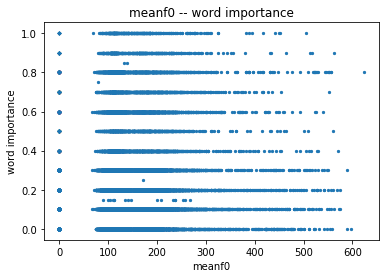

In [200]:
# scatter plot
plt.title("meanf0 -- word importance")
plt.scatter(meanf0, wimp, 5)
plt.xlabel('meanf0')
plt.ylabel('word importance')
plt.show()

In [201]:
# correlation

meanf0.corr(wimp)

0.11008355136163211

#### Trail:  all-feature-all-data 

In [153]:
# compute pearsonr on all pf-all data


for feature in pfs_wimps_df.columns:
    corr_p, p_value = pearsonr(pfs_wimps_df[feature].to_numpy(), pfs_wimps_df['wimp'].to_numpy())
    print("The Pearson Correlation Coefficient between {} and word importance is {}\n The p-value is {}" .format(feature, corr_p, p_value))
    

#### Trail: absolute value

In [156]:
# get the abs value the df due to some negative values in cols like "final_velocity"

pfs_wimps_df = pfs_wimps_df.abs()

In [157]:
pfs_wimps_df.to_csv('../data/pfs_wimps_abs.csv')

In [183]:
%%capture cap --no-stderr
for feature in pfs_wimps_df.columns:
    corr_p, p_value = pearsonr(pfs_wimps_df[feature].to_numpy(), pfs_wimps_df['wimp'].to_numpy())
    print("The Pearson Correlation Coefficient between {} and word importance is {}\n The p-value is {}\n" .format(feature, corr_p, p_value))

In [185]:
with open('../result/corr_p_all_24000_abs.txt', 'w') as f:
    f.write(cap.stdout)

In [186]:
del cap

In [187]:
# force clear all variables 

%reset -f

ERROR:root:Invalid alias: The name clear can't be aliased because it is another magic command.
ERROR:root:Invalid alias: The name more can't be aliased because it is another magic command.
ERROR:root:Invalid alias: The name less can't be aliased because it is another magic command.
ERROR:root:Invalid alias: The name man can't be aliased because it is another magic command.


In [190]:
data = pd.read_csv("../data/pfs_wimps_float64.csv")

In [ ]:
meanf0 = data.meanf0
wimp = data.wimp
plt.scatter(meanf0, wimp, 5)
plt.show()

In [198]:
duration = data.duration

<function matplotlib.pyplot.close(fig=None)>

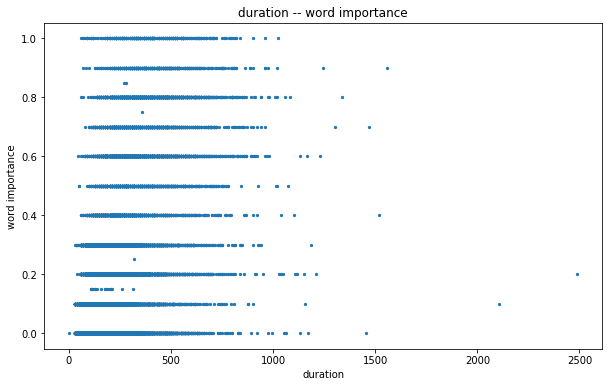

In [224]:
# scatter plot
plt.figure(1, figsize=(10, 6))
plt.title("duration -- word importance")
plt.scatter(data.duration, data.wimp, 5)
plt.xlabel('duration')
plt.ylabel('word importance')
plt.show()
plt.close

## Scatter plot

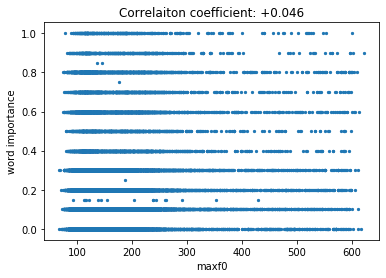

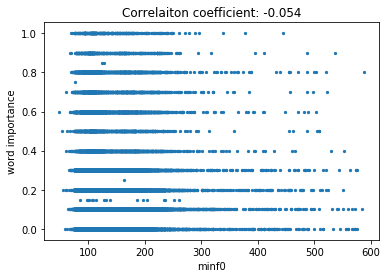

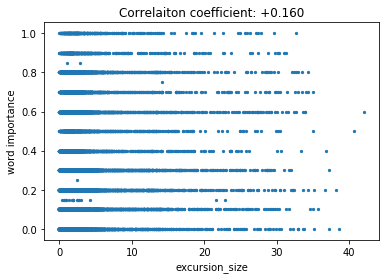

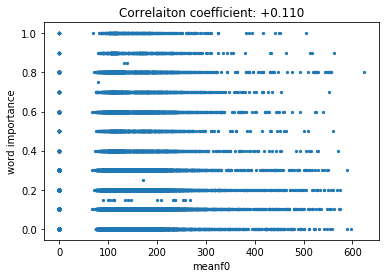

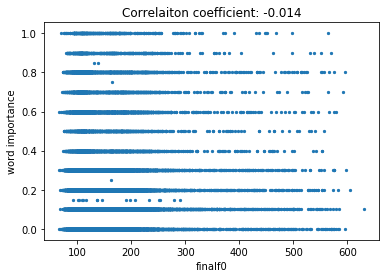

...

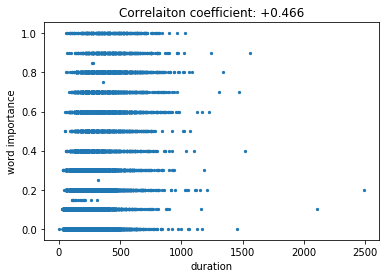

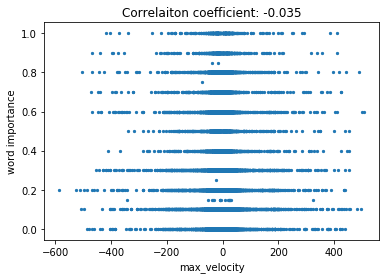

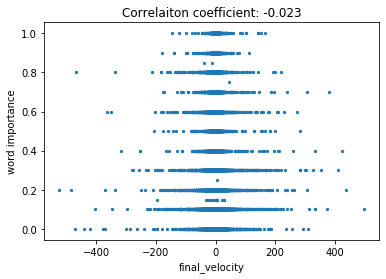

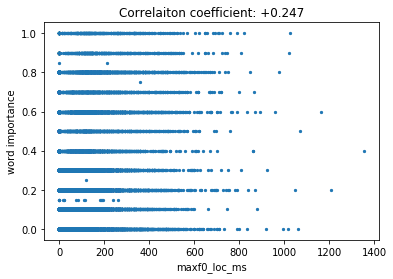

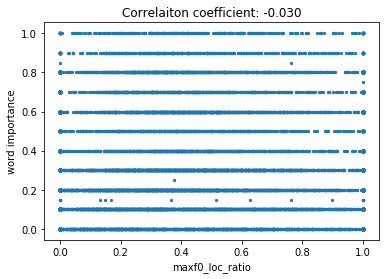

In [247]:
for feature in data.columns[1:12]:
    pf = data[feature]
    corr = pf.corr(wimp)
#     txt = 'Correlaiton coefficient: ' + "{:+.3f}".format(corr)
    plt.figure()
    plt.title('Correlaiton coefficient: ' + "{:+.3f}".format(corr))
    plt.scatter(pf, wimp, 5)
    plt.xlabel(feature)
    plt.ylabel('word importance')
#     plt.figtext(0.5, -0.1, txt, wrap=True, ha='center', fontsize=12)
#     plt.show()
    plt.savefig('../result/stats/'+feature+".jpg", dpi=200)

### Sampling

In [368]:
data_sample = data_nan.sample(n=1000, random_state=2)

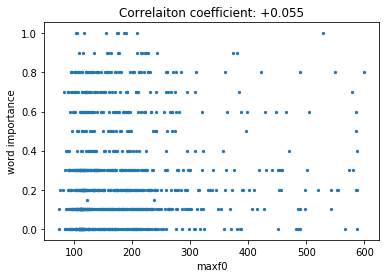

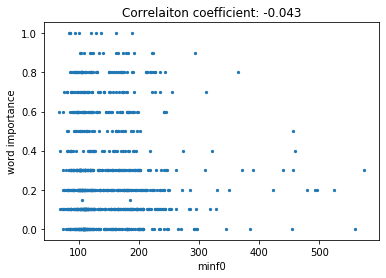

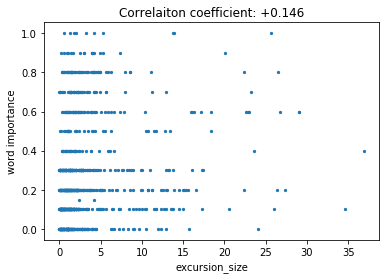

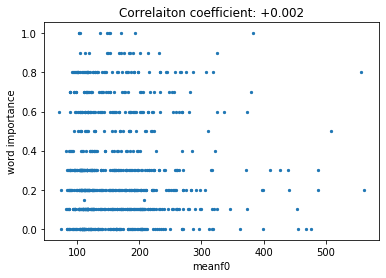

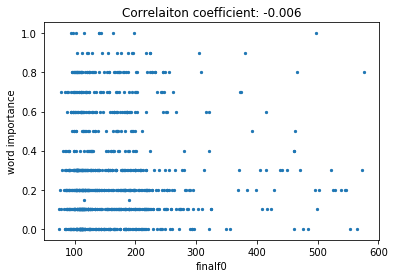

...

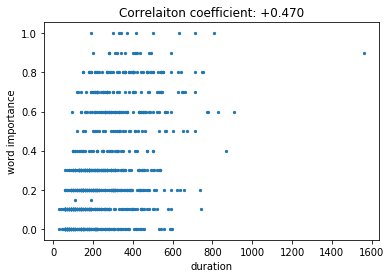

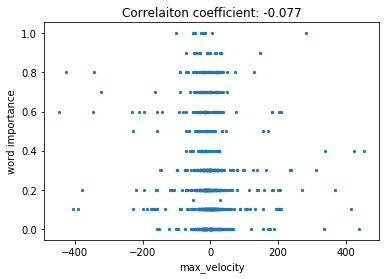

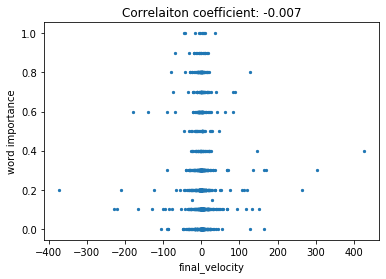

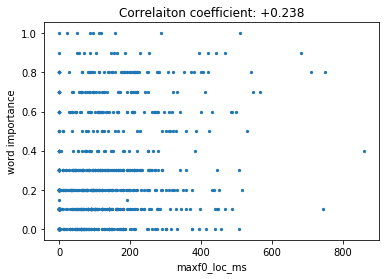

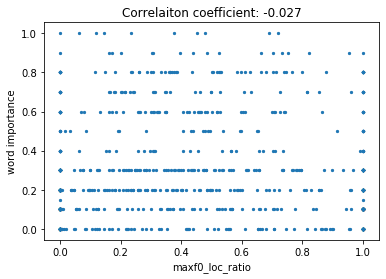

In [369]:
for feature in data_sample.columns[1:12]:
    pf = data_sample[feature]
    corr = pf.corr(data_sample['wimp'])
#     txt = 'Correlaiton coefficient: ' + "{:+.3f}".format(corr)
    plt.figure()
    plt.title('Correlaiton coefficient: ' + "{:+.3f}".format(corr))
    plt.scatter(pf, data_sample['wimp'], 5)
    plt.xlabel(feature)
    plt.ylabel('word importance')
#     plt.figtext(0.5, -0.1, txt, wrap=True, ha='center', fontsize=12)
    plt.show()
#     plt.savefig('../result/stats/'+feature+".jpg", dpi=200)

### Range: Insensity from 25 to 45

In [248]:
# seems that the regression line of mean_intensity from 25 to 45 looks good.

data.mean_intensity.describe()

count    24994.000000
mean        59.610755
std          8.001049
min         24.687570
25%         54.278918
50%         59.694193
75%         65.024103
max         85.602807
Name: mean_intensity, dtype: float64

In [256]:
mean_intensity_25to45 = data.query('25<= mean_intensity<45').mean_intensity

In [257]:
wimp_25to45 = data.query('25<= mean_intensity<45').wimp

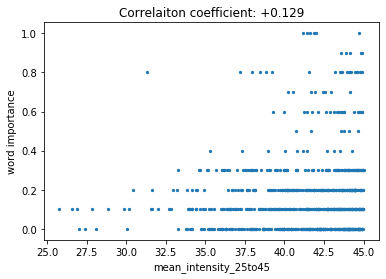

In [258]:
corr = mean_intensity_25to45.corr(wimp_25to45)
plt.figure()
plt.title('Correlaiton coefficient: ' + "{:+.3f}".format(corr))
plt.scatter(mean_intensity_25to45, wimp_25to45, 5)
plt.xlabel('mean_intensity_25to45')
plt.ylabel('word importance')
# plt.show()
plt.savefig('../result/stats/mean_intensity_25to45.jpg', dpi=200)

In [260]:
# can even do it this way 
data[(data.mean_intensity>= 25) & (data.mean_intensity<45)]

,rowLabel,maxf0,minf0,excursion_size,meanf0,finalf0,mean_intensity,duration,max_velocity,final_velocity,maxf0_loc_ms,maxf0_loc_ratio,wimp
6,to,146.022909,139.980932,0.731573,0.0,143.001921,41.104757,60.000,-12.544629,-12.277729,0.000,0.0,0.0
27,home,111.290089,111.088630,0.031367,0.0,111.272821,41.554003,350.000,0.089698,0.089549,350.000,1.0,0.8
29,yeah,102.930954,102.640306,0.048954,0.0,102.904248,41.394022,326.500,0.156224,0.154808,326.500,1.0,0.1
30,um-hum,111.609788,111.164691,0.069179,0.0,111.583082,43.978025,500.000,0.138624,0.138104,500.000,1.0,0.2
34,um-hum,126.849971,126.223090,0.085768,0.0,126.806387,44.311577,431.500,0.212352,0.211971,431.500,1.0,0.0
69,to,109.036776,107.067207,0.315578,0.0,107.608050,40.120059,109.250,-2.891097,-2.851329,0.000,0.0,0.1
84,uh,134.669892,133.726995,0.121639,0.0,134.477301,39.523196,146.875,0.839377,0.838874,146.875,1.0,0.0
92,that,110.930666,109.949561,0.153797,0.0,110.109090,37.213019,184.500,-0.868406,-0.865412,0.000,0.0,0.1
94,could,109.048220,108.211355,0.133372,0.0,108.370885,44.652676,157.375,-0.868558,-0.862493,0.000,0.0,0.2
101,sh[e]-,129.229928,122.642054,0.905837,0.0,128.511250,35.994440,275.000,3.342483,3.311940,275.000,1.0,0.1


### Feature combination (trail)

In [385]:
data = pd.read_csv('../data/pfs_wimps_NaN_standarisaiton.csv')
data.head()

,Unnamed: 0,rowLabel,maxf0,minf0,excursion_size,meanf0,finalf0,mean_intensity,duration,max_velocity,final_velocity,maxf0_loc_ms,maxf0_loc_ratio,wimp
0,0,okay,-0.650463,-0.936330,0.458180,-0.873674,-0.952015,0.067379,1.414375,-0.546548,0.195746,-0.551699,-0.936823,0.0
1,1,uh,-0.898990,-0.943432,-0.299829,-1.034257,-0.954110,-0.222691,-0.208562,0.827837,1.191893,0.818717,1.333183,0.0
2,2,first,-0.095049,-0.775075,1.386980,-0.010607,-0.212131,0.759370,1.445586,0.830686,-0.455519,1.172292,0.189934,0.2
3,3,um,-0.435578,-0.605142,0.259895,-0.624437,-0.627816,0.615253,1.522051,-0.318280,0.144460,-0.923737,-1.183064,0.0
4,4,i,-0.537824,-0.394024,-0.416700,-0.530714,-0.464780,0.044613,-0.853055,0.592330,0.581444,0.000952,1.333183,0.1


In [390]:
meanf0_dur= data.meanf0 + data.duration
meanf0_dur

0        0.540701
1       -1.242819
2        1.434979
3        0.897614
4       -1.383769
5       -0.838386
6             NaN
7        0.279874
8       -0.673088
9             NaN
10       0.099220
11      -1.063045
12            NaN
13      -0.341753
14       0.128986
15            NaN
16      -0.412910
17       0.748141
18       0.720270
19            NaN
20       0.919913
21       0.010076
22      -0.606321
23      -0.016555
24       0.038694
25            NaN
26            NaN
27            NaN
28       0.373886
29            NaN
           ...   
24964   -1.518005
24965   -0.527421
24966   -0.937790
24967    0.482023
24968   -1.707369
24969   -0.905170
24970   -1.388460
24971   -0.623489
24972   -0.796457
24973   -1.169489
24974   -0.978598
24975   -1.139143
24976   -0.965960
24977   -1.331804
24978   -1.861380
24979   -0.270189
24980   -1.604703
24981   -1.556500
24982         NaN
24983    0.680271
24984   -0.899525
24985   -1.067903
24986   -1.087806
24987         NaN
24988     

In [392]:
meanf0_dur.corr(data.wimp)

0.3173722577656492

In [393]:
data.duration.corr(data.wimp)

0.46649236709838493

In [394]:
data.meanf0.corr(data.wimp)

-0.002082990484813087

In [395]:
intensity_dur = data.mean_intensity + data.duration
intensity_dur

0        1.481754
1       -0.431253
2        2.204956
3        2.137304
4       -0.808442
5       -0.613031
6       -3.520285
7        0.899381
8       -0.157971
9       -1.026370
10       0.933761
11      -1.109910
12      -1.290157
13      -0.027113
14       0.735911
15      -0.354040
16       0.264837
17       1.002564
18       0.897105
19      -1.547166
20       1.031415
21      -0.247114
22      -0.146651
23      -0.388470
24       0.417089
25      -2.063856
26      -0.837895
27      -1.653936
28       0.630285
29      -1.820620
           ...   
24964   -0.535200
24965    0.971751
24966    0.226888
24967    2.078232
24968   -0.654622
24969   -0.014302
24970   -0.130425
24971    0.367110
24972    0.141636
24973   -0.756879
24974    0.158604
24975   -0.125304
24976   -0.533565
24977   -1.190323
24978   -1.458285
24979    1.154660
24980   -0.958361
24981   -1.141654
24982   -2.320435
24983    1.833597
24984   -0.424396
24985   -1.110073
24986   -1.127756
24987   -0.922400
24988   -0

In [396]:
intensity_dur.corr(data.wimp)

0.3987115449802634

In [397]:
data.mean_intensity.corr(data.wimp)

0.11254300094944764

In [398]:
data.duration.corr(data.wimp)

0.46649236709838493

In [399]:
intensity_dur_meanf0 = data.mean_intensity + data.duration + data.meanf0
intensity_dur_meanf0

0        0.608080
1       -1.465510
2        2.194349
3        1.512867
4       -1.339156
5       -0.882376
6             NaN
7        0.264245
8       -0.992340
9             NaN
10       0.755443
11      -1.296492
12            NaN
13      -0.459143
14      -0.013441
15            NaN
16      -0.480231
17       0.428399
18       0.055531
19            NaN
20       0.341888
21      -1.119278
22      -0.782389
23      -1.171006
24      -0.171311
25            NaN
26            NaN
27            NaN
28      -0.160523
29            NaN
           ...   
24964   -1.095595
24965    0.590471
24966   -0.190236
24967    1.582824
24968   -1.217120
24969   -0.211545
24970   -0.623696
24971    0.014603
24972   -0.258997
24973   -1.218441
24974   -0.361749
24975   -0.721935
24976   -1.092777
24977   -1.722130
24978   -2.112373
24979    0.593668
24980   -1.605455
24981   -1.802965
24982         NaN
24983    1.286755
24984   -0.928097
24985   -1.729875
24986   -1.637938
24987         NaN
24988     

In [400]:
intensity_dur_meanf0.corr(data.wimp)

0.279965270954384

In [401]:
f0loc_dur = data.maxf0_loc_ms + data.duration
f0loc_dur

0        0.862676
1        0.610155
2        2.617877
3        0.598314
4       -0.852103
5       -0.689132
6       -2.131029
7       -0.008727
8       -0.762456
9       -0.020068
10       1.312046
11      -1.800200
12      -1.249337
13      -0.833460
14      -0.045399
15       3.279751
16       0.421446
17       1.213611
18       1.130470
19      -0.018297
20       1.540709
21       3.085019
22      -0.518671
23       2.821246
24       0.783840
25      -1.514191
26       2.876125
27       2.451256
28       0.558508
29       2.118441
           ...   
24964   -1.089322
24965   -0.466131
24966   -0.822812
24967    0.976111
24968   -2.068608
24969   -0.805478
24970   -1.818926
24971   -0.433944
24972   -0.124821
24973   -1.631664
24974   -0.624859
24975   -1.392791
24976   -0.234305
24977   -1.723734
24978   -2.131029
24979    0.684738
24980   -1.618091
24981   -0.947699
24982   -1.655815
24983    1.166143
24984   -0.628393
24985   -1.371838
24986   -0.227191
24987    0.332220
24988    1

In [402]:
f0loc_dur.corr(data.wimp)

0.4080511701697926

In [141]:
# del
# compute cor-co for multiple files

# input: number of samples, feature_name_1, feature_name_2
# output: coefficient, plot

def correlation(num, feature1, feature2="wimp"):
    
    flat_pf = []
    for pf in pfs:
        for item in pf[:, feature_dict[feature]]:
            flat_pf.append(item)
    flat_pf = np.asarray(flat_pf, dtype=float)
    
    
    c_matrix = np.array([flat_pf[:num], flat_wimps[:num]])
    #print(c_matrix)
    
    corr_matrix = np.corrcoef(c_matrix.astype(float))
    print(corr_matrix)
    smg.plot_corr(corr_matrix, xnames=[feature], ynames=["wi"])
    plt.show()

array([103.08329929,  91.82815735, 163.57502188, 120.55213549,
       127.12115618, 145.44030691,   0.        , 119.80223325,
       105.83822436,   0.        , 151.82024514, 151.24109209,
         0.        , 134.03777446, 111.79698226,   0.        ,
       112.09724493, 124.07573077, 105.33316007,   0.        ,
       115.99001968, 103.18921655, 119.76010272, 109.47110636,
       123.07790455,   0.        ,   0.        ,   0.        ,
       108.89138627,   0.        ,   0.        , 116.38556539,
       120.28390825, 117.42550937,   0.        , 120.70828475,
       166.42466836, 118.59901226, 140.71313568, 127.57168329,
       120.83483069,   0.        , 120.36446012, 112.46837728,
         0.        ,   0.        , 118.52125104, 120.39297096,
       112.05027368,   0.        ,   0.        , 112.59381702,
         0.        , 110.48340893, 113.00127911, 107.39422976,
       112.46306271, 143.83020254, 133.68296658, 158.46774301,
       117.79114889, 113.24355628, 103.17445471, 114.68

## p-value

The p-value roughly indicates **the probability of an uncorrelated system** producing datasets that have a Pearson correlation at least as extreme as the one computed from these datasets. 

The p-values are **not entirely reliable** but are probably reasonable for datasets **larger than 500** or so.

now processing:  ../prosody_pro/test_sw2005A/duration
[[ 1.         -0.01155001]
 [-0.01155001  1.        ]]
now processing:  ../prosody_pro/test_sw2005A/excursionsize
[[1.         0.11720182]
 [0.11720182 1.        ]]
now processing:  ../prosody_pro/test_sw2005A/finalf0
[[ 1.         -0.02703742]
 [-0.02703742  1.        ]]
now processing:  ../prosody_pro/test_sw2005A/finalvelocity
[[1.00000000e+00 1.33448987e-04]
 [1.33448987e-04 1.00000000e+00]]
now processing:  ../prosody_pro/test_sw2005A/maxf0
[[1.         0.01577036]
 [0.01577036 1.        ]]
now processing:  ../prosody_pro/test_sw2005A/maxf0_loc_ms
[[ 1.         -0.04917057]
 [-0.04917057  1.        ]]
now processing:  ../prosody_pro/test_sw2005A/maxf0_loc_ratio
[[ 1.        -0.1514473]
 [-0.1514473  1.       ]]
now processing:  ../prosody_pro/test_sw2005A/maxvelocity
[[1.         0.04750583]
 [0.04750583 1.        ]]
now processing:  ../prosody_pro/test_sw2005A/meanf0
[[1.         0.36801756]
 [0.36801756 1.        ]]
now proce

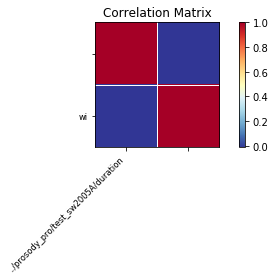

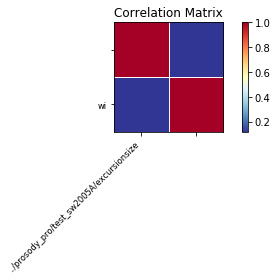

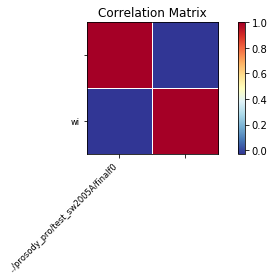

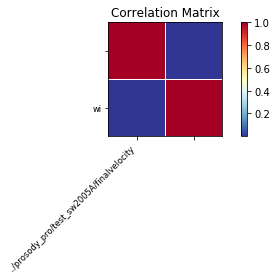

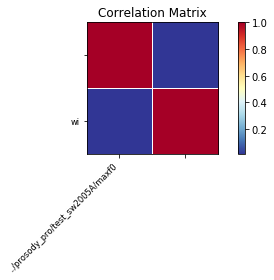

...

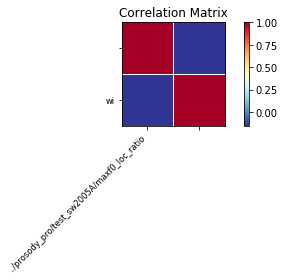

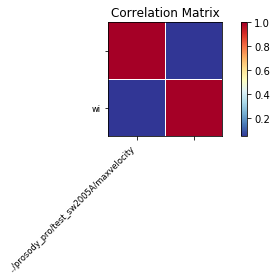

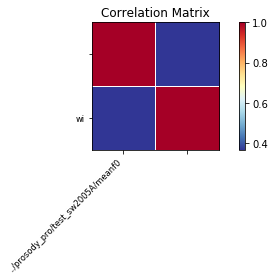

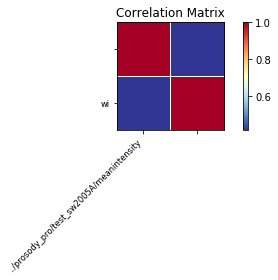

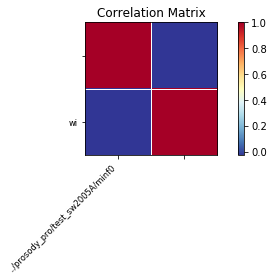

In [167]:
### del
### codes for reading data from .txt pf files


cor_path_list = sorted(glob.glob("../prosody_pro/test_sw2005A/*.txt"))

wi= pd.read_csv("/Users/the-imitation-gamer/Documents/SLP/Msc_Dissertation/wimp_corpus/annotations/20/2005/sw2005A-ms98-a-word.text", sep="\s+", header=None, engine="python")

#wi = np.loadtxt(fname = "/Users/the-imitation-gamer/Documents/SLP/Msc_Dissertation/wimp_corpus/annotations/20/2005/sw2005A-ms98-a-word.text")
wi.columns = ["ms_id", "start_time", "end_time", "imp"]
wi = wi.imp.to_numpy()

# try to replace 0 with a small value
#wi = np.where(wi == 0, 0.05, wi)
# print(wi)
# print(len(wi))



for i in range(len(cor_path_list)):
    pf_test=pd.read_csv(cor_path_list[i], sep='\t')
    print("now processing: ", os.path.splitext(cor_path_list[i])[0])
    # print(pf_test)
    pf_test=pf_test.to_numpy()
    # print(pf_test.shape)
    slope_test = pf_test[0][1:]
    slope_test = np.where(slope_test == "--undefined--", 0, slope_test)
    slope_test = np.absolute(slope_test)
    # print(slope_test)
    
    c_matrix = np.array([slope_test, wi])
    # cast c_matrix to float incase of the attribuet error of .cov()
    corr_matrix = np.corrcoef(c_matrix.astype(float))
    print(corr_matrix)
    smg.plot_corr(corr_matrix, xnames=[os.path.splitext(cor_path_list[i])[0]], ynames=["wi"])
    #plt.show()
    
    plt.savefig(os.path.splitext(cor_path_list[i])[0] + ".jpg")

In [57]:
# compute cor-co for multiple files

# input: number of samples, feature_name_1, feature_name_2
# output: coefficient, plot

def correlation(num, feature):
    
    flat_pf = []
    for pf in pfs:
        for item in pf[:, feature_dict[feature]]:
            flat_pf.append(item)
    flat_pf = np.asarray(flat_pf, dtype=float)
    
    
    c_matrix = np.array([flat_pf[:num], flat_wimps[:num]])
    #print(c_matrix)
    
    corr_matrix = np.corrcoef(c_matrix.astype(float))
    print(corr_matrix)
    smg.plot_corr(corr_matrix, xnames=[feature], ynames=["wi"])
    plt.show()

In [63]:
def correlation(num, feature):
    
    flat_pf = []
    for pf in pfs:
        for item in pf[:, feature_dict[feature]]:
            flat_pf.append(item)
    flat_pf = np.asarray(flat_pf, dtype=float) # c_matrix needs to be float
    
    
    c_matrix = np.array([flat_pf[:num], flat_wimps[:num]])
    
    
    corr_matrix = np.corrcoef(c_matrix)
    print(corr_matrix[0,1])
    smg.plot_corr(corr_matrix, xnames=[feature], ynames=["wi"])
    plt.show()

0.4117810929649494


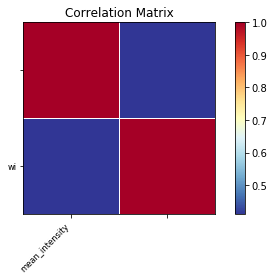

In [64]:
correlation(5000, "mean_intensity")

[[1.         0.41178109]
 [0.41178109 1.        ]]


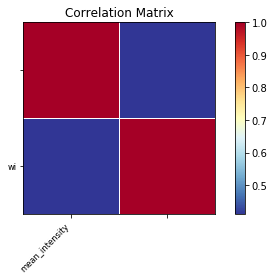

[[1.         0.37754034]
 [0.37754034 1.        ]]


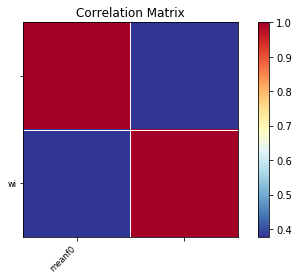

In [49]:
for i in feature_dict:
    print(feature_dict[i])


correlation(5000, "mean_intensity")
correlation(5000, "meanf0")

(33302,)
(33302,)
[[1.         0.40135501]
 [0.40135501 1.        ]]


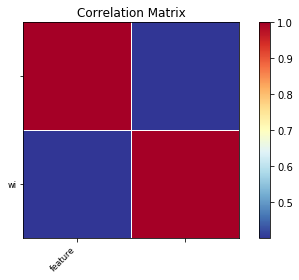

In [55]:
# test feature combination: meanf0 + mean intensity

flat_pf1 = []
for pf in pfs:
    for item in pf[:, feature_dict["mean_intensity"]]:
        flat_pf1.append(item)
flat_pf1 = np.asarray(flat_pf1, dtype=float)
print(flat_pf1.shape)

flat_pf2 = []
for pf in pfs:
    for item in pf[:, feature_dict["meanf0"]]:
        flat_pf2.append(item)
flat_pf2 = np.asarray(flat_pf2, dtype=float)
print(flat_pf2.shape)

flat_pf_add = np.add(flat_pf1, flat_pf2)

c_matrix = np.array([flat_pf_add[:5000], flat_wimps[:5000]])
#print(c_matrix)
    
corr_matrix = np.corrcoef(c_matrix.astype(float))
print(corr_matrix)
smg.plot_corr(corr_matrix, xnames=["feature"], ynames=["wi"])
plt.show()

In [77]:
test_l = [1.0, 2.0, "--no--"]
print(test_l)
# test_l.shape
for item in test_l:
    if isinstance(item, float):
        item = item
    else:
        item = 0
    print(item)
test_l = np.array(test_l)
print(test_l)

[1.0, 2.0, '--no--']
1.0
2.0
0
['1.0' '2.0' '--no--']


In [169]:
%%capture cap --no-stderr
print ('stuff no')
with open('../result/output.txt', 'w') as f:
    f.write(cap.stdout)

In [132]:
np.mean(np.delete(slope_test, "--undefined--")

[ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 51 52 53 54 55 56 57 58 59 60 61 62 63 64 65 66 67 68 69 70 71 72
 73 74 75 76 77 78 79 80 81 82 83 84 85 86 87 88 89 90 91 92 93 94 95 96
 97 98 99]


# Neural Network

In [370]:
# data processing

hhh = pd.read_csv('../data/csv/pfs_wimps_abs.csv')

In [371]:
hhh_np = hhh.to_numpy()

In [328]:
words = hhh_np[:, 0]
label = hhh_np[:, -1]
features = hhh[:, 1:-1]
nor_features = features / np.sum(features, axis=1)[-1]
nor_features[:10]

array([[0.15505773783262203, 0.11472108835864127, 0.006591691267579763,
        0.13026848222593115, 0.11589137368583873, 0.07601259251826793,
        0.606585857245704, 0.052099068808359426, 0.007675622983733659,
        0.059360730632421206, 0.0001236681888175442],
       [0.12689071962739482, 0.11418511811037076, 0.0023082400151788057,
        0.11604512822416505, 0.11569894091903192, 0.07307973146921692,
        0.278018517904281, 0.06351003387982027, 0.047272871467167826,
        0.278018517904281, 0.00126372053592855],
       [0.21800605718015145, 0.12689071962739482, 0.011840277829330339,
        0.20671311431046063, 0.18384946313133238, 0.08300924361781509,
        0.612904459925347, 0.0637497072749262, 0.018212402317327833,
        0.33443336092655496, 0.0006895533214980512],
       [0.17941191649081703, 0.13971522499920208, 0.005471199325564086,
        0.15234420926946543, 0.14566893434917388, 0.08155208917748172,
        0.6283850364904715, 0.032897852334183214, 0.005637004

In [387]:
words = hhh_np[:, 0]
label = hhh_np[:, -1]
features = hhh_np[:, 1:-1]
nor_features = features / np.sum(features, axis=1)[-1]
nor_features[:10]

array([[0.15505773783262203, 0.11472108835864127, 0.006591691267579763,
        0.13026848222593115, 0.11589137368583873, 0.07601259251826793,
        0.606585857245704, 0.052099068808359426, 0.007675622983733659,
        0.059360730632421206, 0.0001236681888175442],
       [0.12689071962739482, 0.11418511811037076, 0.0023082400151788057,
        0.11604512822416505, 0.11569894091903192, 0.07307973146921692,
        0.278018517904281, 0.06351003387982027, 0.047272871467167826,
        0.278018517904281, 0.00126372053592855],
       [0.21800605718015145, 0.12689071962739482, 0.011840277829330339,
        0.20671311431046063, 0.18384946313133238, 0.08300924361781509,
        0.612904459925347, 0.0637497072749262, 0.018212402317327833,
        0.33443336092655496, 0.0006895533214980512],
       [0.17941191649081703, 0.13971522499920208, 0.005471199325564086,
        0.15234420926946543, 0.14566893434917388, 0.08155208917748172,
        0.6283850364904715, 0.032897852334183214, 0.005637004

In [388]:
label[:30]

array([0.0, 0.0, 0.2, 0.0, 0.1, 0.4, 0.0, 0.5, 0.0, 0.3, 0.0, 0.1, 0.1,
       0.5, 0.2, 0.0, 0.2, 0.6, 0.0, 0.0, 0.7, 0.0, 0.8, 0.6, 0.0, 0.0,
       0.9, 0.8, 0.5, 0.1], dtype=object)

In [389]:
label = np.where(label<0.3, -1, label)
label[:30]

array([-1, -1, -1, -1, -1, 0.4, -1, 0.5, -1, 0.3, -1, -1, -1, 0.5, -1, -1,
       -1, 0.6, -1, -1, 0.7, -1, 0.8, 0.6, -1, -1, 0.9, 0.8, 0.5, -1],
      dtype=object)

In [390]:
label = np.where(label>0.5, 1, label)
label[:30]

array([-1, -1, -1, -1, -1, 0.4, -1, 0.5, -1, 0.3, -1, -1, -1, 0.5, -1, -1,
       -1, 1, -1, -1, 1, -1, 1, 1, -1, -1, 1, 1, 0.5, -1], dtype=object)

In [391]:
label = np.where(np.absolute(label) !=1, 0, label)
label[:30]

array([-1, -1, -1, -1, -1, 0, -1, 0, -1, 0, -1, -1, -1, 0, -1, -1, -1, 1,
       -1, -1, 1, -1, 1, 1, -1, -1, 1, 1, 0, -1], dtype=object)

In [395]:
label = np.where(label==-1, 2, label)
label[:30]

array([2, 2, 2, 2, 2, 0, 2, 0, 2, 0, 2, 2, 2, 0, 2, 2, 2, 1, 2, 2, 1, 2,
       1, 1, 2, 2, 1, 1, 0, 2], dtype=object)

In [396]:
feature_label = [(nor_features[i], label[i] ) for i in range(len(nor_features))]
feature_label[:30]

[(array([0.15505773783262203, 0.11472108835864127, 0.006591691267579763,
         0.13026848222593115, 0.11589137368583873, 0.07601259251826793,
         0.606585857245704, 0.052099068808359426, 0.007675622983733659,
         0.059360730632421206, 0.0001236681888175442], dtype=object), 2),
 (array([0.12689071962739482, 0.11418511811037076, 0.0023082400151788057,
         0.11604512822416505, 0.11569894091903192, 0.07307973146921692,
         0.278018517904281, 0.06351003387982027, 0.047272871467167826,
         0.278018517904281, 0.00126372053592855], dtype=object), 2),
 (array([0.21800605718015145, 0.12689071962739482, 0.011840277829330339,
         0.20671311431046063, 0.18384946313133238, 0.08300924361781509,
         0.612904459925347, 0.0637497072749262, 0.018212402317327833,
         0.33443336092655496, 0.0006895533214980512], dtype=object), 2),
 (array([0.17941191649081703, 0.13971522499920208, 0.005471199325564086,
         0.15234420926946543, 0.14566893434917388, 0.081552089

In [331]:
label=label.astype(int)
label[:3]

array([0, 0, 2])

In [369]:
ttt = np.arange(11)
np.where(ttt<4, -1, 1)

array([-1, -1, -1, -1,  1,  1,  1,  1,  1,  1,  1])

In [397]:
with open('./wimp_3.pkl', 'wb') as f:
    pickle.dump(feature_label, f)